# Helmholtz's equation (Physics informed)

## Mapping sparse data $u(x,y)$ to the $g(x,y)$

$$ \nabla^2 u(x,y) - k^2u = g(x,y) ~~~ x,y \in (0,1)^2$$ 

$$ u_{\text{bc}} = 0$$

Two gaussian source:
$$ \text{Data}: A \sim U(1,10), ~~x_0, y_0 \sim U(0.2, 0.8), \text{and  } sigma \sim U(0.05, 0.2)$$ 

Number of samples: 3000

In [1]:
from flax import linen as nn
from typing import Sequence, Tuple
import jax
import jax.numpy as jnp
from torch.utils import data
from functools import partial
import time
import optax
import scipy.io
import os
import matplotlib.pyplot as plt
import shutil
import pandas as pd
from jax import jvp
import pickle
from sklearn import metrics
from termcolor import colored
import random
import numpy as np
from scipy.interpolate import griddata
import matplotlib.tri as tri
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import MaxNLocator, ScalarFormatter

In [2]:
## All inputs

path_data = 'helmholtz_gaussian_sources_dataset.npz'

seed = 32
n_train = int(800*0.8)
batch_size = 75
n_sensors = 32*32 # (x*y)
branch_layers = [32, 32, 32]
h_layers = [32, 32, 32]
branch_input_features = 1
trunk_layers = [32, 32, 32]
trunk_input_features = 2
out_features = 6
hidden_dim = 100
p_test = 100
p_res_train = 2000
result_dir = './'
epochs = 80000
vis_iter = 1000
lr = 1e-3
transition_steps = 2000
decay_rate = 0.9


In [3]:

data_source = jnp.load(path_data, allow_pickle=True)

sources = data_source['sources']
solutions = data_source['solutions']
params_array = data_source['params_array']
params_arr = jnp.array(params_array)

params_array = jnp.delete(params_arr, jnp.array([3]), axis=1)


sensor_32x32 = data_source['sensor_32x32']
sensor_32x32_xcoords = data_source['sensor_32x32_xcoords']
sensor_32x32_ycoords = data_source['sensor_32x32_ycoords']
# sensor_5x5 = data_dline['sensor_5x5']
# sensor_5x5_xcoords = data_dline['sensor_5x5_xcoords']
# sensor_5x5_ycoords = data_dline['sensor_5x5_ycoords']


print("sources: ", sources.shape)
print("solutions: ", solutions.shape)
print("sensor_32x32: ", sensor_32x32.shape)
print("sensor_32x32_xcoords: ", sensor_32x32_xcoords.shape)
print("sensor_32x32_ycoords: ", sensor_32x32_ycoords.shape)

print("params_array: ", params_array.shape)

X_sensor = jnp.array(sensor_32x32).reshape(800, -1)   # (3000, 256)

x_coords = jnp.array(sensor_32x32_xcoords).reshape(-1)   # (256,)
y_coords = jnp.array(sensor_32x32_ycoords).reshape(-1)   # (256,)

sensor_xy = jnp.stack([x_coords, y_coords], axis=1)     # (256, 2)

Y_solutions = jnp.array(solutions).reshape(800, -1)      # (3000, 4096)

n = 64
x_lin = jnp.linspace(0, 1, n)
y_lin = jnp.linspace(0, 1, n)

Xg, Yg = jnp.meshgrid(x_lin, y_lin, indexing="xy")

solutions_xy = jnp.stack([Xg.reshape(-1), Yg.reshape(-1)], axis=1)   # (4096, 2)

print("X_sensor:", X_sensor.shape)
print("sensor_xy:", sensor_xy.shape)
print("Y_solutions:", Y_solutions.shape)
print("solutions_xy:", solutions_xy.shape)

sources:  (800, 64, 64)
solutions:  (800, 64, 64)
sensor_32x32:  (800, 32, 32)
sensor_32x32_xcoords:  (32, 32)
sensor_32x32_ycoords:  (32, 32)
params_array:  (800, 3)
X_sensor: (800, 1024)
sensor_xy: (1024, 2)
Y_solutions: (800, 4096)
solutions_xy: (4096, 2)



SAMPLE #0 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5529
   Location (x1, y1):  (0.4821, 0.4546)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0022 / 2.5508
   Solution min/max:   0.0000 / 0.0983



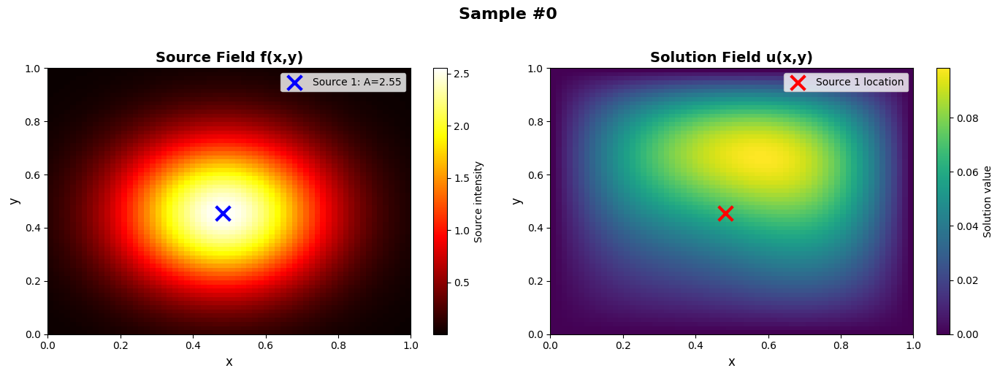


SAMPLE #1 - PARAMETERS

Source 1:
   Amplitude (A1):     3.8541
   Location (x1, y1):  (0.6398, 0.5225)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0008 / 3.8529
   Solution min/max:   -0.0497 / 0.2090



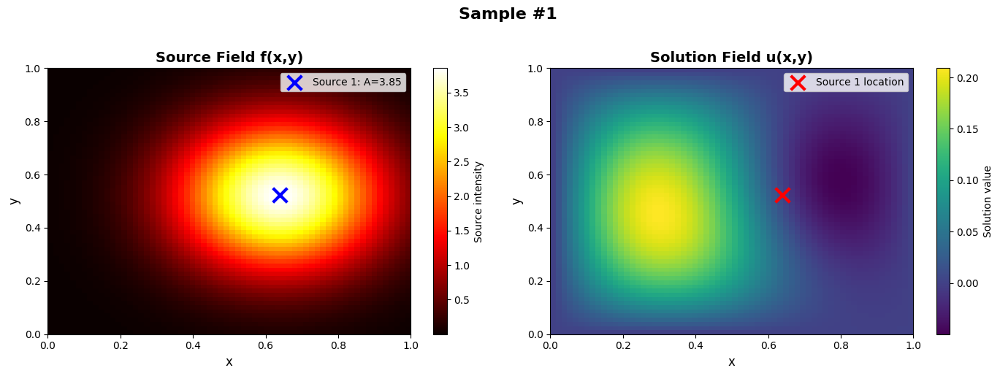


SAMPLE #2 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5419
   Location (x1, y1):  (0.3726, 0.4240)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0003 / 2.5395
   Solution min/max:   -0.0428 / 0.1429



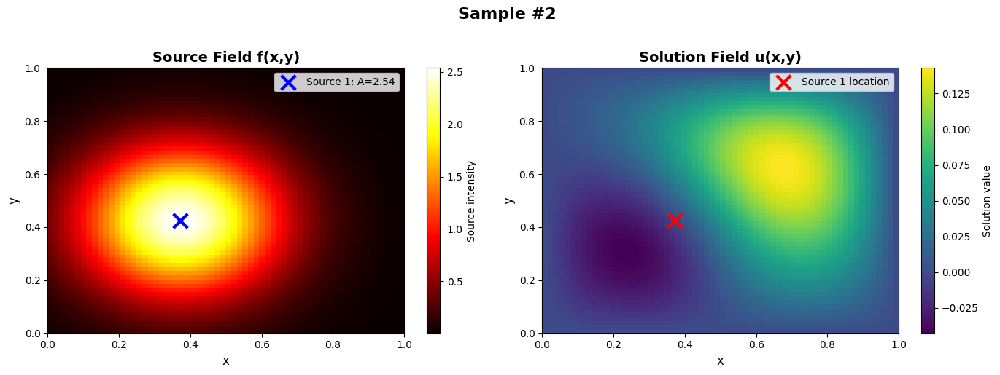

In [4]:
import matplotlib.pyplot as plt

def visualize_sample(idx, sources, solutions, params_array):
    """
    Visualize a single sample with source, solution, and parameters
    
    Parameters for 2 Gaussians:
    [A1, x1, y1, sigma1, A2, x2, y2, sigma2]
    """
    # Extract data
    source = sources[idx]
    solution = solutions[idx]
    params = params_array[idx]
    
    # # Parse parameters
    # x1, y1, sigma1 = params[0:3]
    # A1= 10
    # A1, x1, y1, sigma1 = params[0:4]
    A1, x1, y1 = params[0:3]
    sigma1 = 0.2
    # A2, x2, y2, sigma2 = params[4:8]
    # sigma1, sigma2 = 0.08, 0.08
    # A1, x1, y1 = params[0:3]
    # A2, x2, y2 = params[3:7]
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Plot 1: Source field f(x,y)
    im1 = axes[0].imshow(source, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='hot', aspect='auto')
    axes[0].scatter([x1], [y1], c='blue', s=200, marker='x', linewidths=3, 
                    label=f'Source 1: A={A1:.2f}')
    # axes[0].scatter([x2], [y2], c='cyan', s=200, marker='x', linewidths=3, 
    #                 label=f'Source 2: A={A2:.2f}')
    axes[0].set_xlabel('x', fontsize=12)
    axes[0].set_ylabel('y', fontsize=12)
    axes[0].set_title(f'Source Field f(x,y)', fontsize=14, fontweight='bold')
    axes[0].legend(loc='upper right', fontsize=10)
    plt.colorbar(im1, ax=axes[0], label='Source intensity')
    
    # Plot 2: Solution field u(x,y)
    im2 = axes[1].imshow(solution, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='viridis', aspect='auto')
    axes[1].scatter([x1], [y1], c='red', s=200, marker='x', linewidths=3, 
                    label='Source 1 location')
    # axes[1].scatter([x2], [y2], c='orange', s=200, marker='x', linewidths=3, 
    #                 label='Source 2 location')
    axes[1].set_xlabel('x', fontsize=12)
    axes[1].set_ylabel('y', fontsize=12)
    axes[1].set_title(f'Solution Field u(x,y)', fontsize=14, fontweight='bold')
    axes[1].legend(loc='upper right', fontsize=10)
    plt.colorbar(im2, ax=axes[1], label='Solution value')
    
    plt.suptitle(f'Sample #{idx}', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    # Print parameters
    print(f"\n{'='*60}")
    print(f"SAMPLE #{idx} - PARAMETERS")
    print(f"{'='*60}")
    print(f"\nSource 1:")
    print(f"   Amplitude (A1):     {A1:.4f}")
    print(f"   Location (x1, y1):  ({x1:.4f}, {y1:.4f})")
    print(f"   Width (σ1):         {sigma1:.4f}")
    
    # print(f"\n Source 2:")
    # print(f"   Amplitude (A2):     {A2:.4f}")
    # print(f"   Location (x2, y2):  ({x2:.4f}, {y2:.4f})")
    # print(f"   Width (σ2):         {sigma2:.4f}")
    
    print(f"\n Statistics:")
    print(f"   Source min/max:     {source.min():.4f} / {source.max():.4f}")
    print(f"   Solution min/max:   {solution.min():.4f} / {solution.max():.4f}")
    # print(f"   Distance between sources: {np.sqrt((x2-x1)**2 + (y2-y1)**2):.4f}")
    print(f"{'='*60}\n")
    
    return fig


# Visualize first 3 samples
for i in range(3):
    i*10
    fig = visualize_sample(i, sources, solutions, params_array)
    plt.savefig(f'sample_{i}.png', dpi=150, bbox_inches='tight')
    plt.show()

In [5]:
# Shuffle the data
indices = np.arange(X_sensor.shape[0])
np.random.shuffle(indices)

shuffled_sensor_data = X_sensor[indices]
shuffled_solution_data = Y_solutions[indices]
shuffled_param_data = params_array[indices]

# Split
X_train = shuffled_sensor_data[:n_train]
X_test = shuffled_sensor_data[n_train:]

y_train = shuffled_sensor_data[:n_train]
y_test = shuffled_solution_data[n_train:]

param_train = shuffled_param_data[:n_train]
param_test = shuffled_param_data[n_train:]


print("X_train: ", str(X_train.shape))
print("X_test: ", str(X_test.shape))

print("y_train: ", str(y_train.shape))
print("y_test: ", str(y_test.shape))

print("param_train: ", str(param_train.shape))
print("param_test: ", str(param_test.shape))

X_train:  (640, 1024)
X_test:  (160, 1024)
y_train:  (640, 1024)
y_test:  (160, 4096)
param_train:  (640, 3)
param_test:  (160, 3)


In [6]:
# Data Generator
class DataGenerator(data.Dataset):
    def __init__(self, u_data, y, s, param, batch_size, gen_key):
        self.u_data = u_data
        self.y = y
        self.s = s
        self.param = param
        self.N = u_data.shape[0]
        self.batch_size = batch_size
        self.key = gen_key

    def __getitem__(self, index):
        """Generate one batch of data"""
        self.key, subkey = jax.random.split(self.key)
        inputs, outputs = self.__data_generation(subkey)
        return inputs, outputs

    @partial(jax.jit, static_argnums=(0,))
    def __data_generation(self, key_i):
        """Generates data containing batch_size samples"""
        idx = jax.random.choice(key_i, self.N, (self.batch_size,), replace=False)
        s = self.s[idx, :]
        y = self.y[:, :]
        u_data = self.u_data[idx]
        param = self.param[idx]
        # Construct batch
        inputs = (u_data, y, param)
        outputs = s
        return inputs, outputs

In [7]:
"""# Data generation for each sample"""
def generate_one_res_training_data(X_train, key, p=2500):
    # p_grid = int(jnp.sqrt(p))  # Base number along each axis
    p_grid = 64
    # Generate sorted 1D points
    # x_res_i = jnp.sort(jax.random.uniform(key, shape=(p_grid,), minval=0.0, maxval=1.0))
    # y_res_i = jnp.sort(jax.random.uniform(key, shape=(p_grid,), minval=0.0, maxval=1.0))
    x_res_i = jnp.linspace(0, 1, p_grid)
    y_res_i = jnp.linspace(0, 1, p_grid)
    
    # Create 3D meshgrid
    x_res, y_res = jnp.meshgrid(x_res_i, y_res_i, indexing='xy')

    # Flatten grids
    x_flat = x_res.flatten()
    y_flat = y_res.flatten()

    # Stack into coordinates shape (N, 2)
    cord = jnp.stack([x_flat, y_flat], axis=-1)

    sol = jnp.zeros((cord.shape[0],))

    return cord, sol

# Generate bcs training data corresponding to one input sample
def generate_one_bcs_training_data(X_train, key, p=100):

    # for x = 0 (left boundary)
    yy_0 = jnp.linspace(0, 1, p).reshape(-1,1)
    xx_0 = jnp.zeros((p, 1))

    cord1 = jnp.hstack([xx_0, yy_0])

    # for x = 1 (right boundary)
    yy_1 = jnp.linspace(0, 1, p).reshape(-1,1)
    xx_1 = jnp.ones((p, 1))

    cord2 = jnp.hstack([xx_1, yy_1])

    # for y = 0 (bottom boundary)
    xx_y0 = jnp.linspace(0, 1, p).reshape(-1,1)
    yy_y0 = jnp.zeros((p, 1))

    cord3 = jnp.hstack([xx_y0, yy_y0])

    # for y = 1 (top boundary)
    xx_y1 = jnp.linspace(0, 1, p).reshape(-1,1)
    yy_y1 = jnp.ones((p, 1))

    cord4 = jnp.hstack([xx_y1, yy_y1])

    cord = jnp.hstack([cord1, cord2, cord3, cord4])  # shape = (p, 8)
    s = jnp.zeros((p,))  # Shape: (p,)

    return cord, s

In [8]:
"""# Data generation for each sample"""

key = jax.random.PRNGKey(seed)
keys = jax.random.split(key, 6)

print("----Coll----")
# Residual data
cord_res_train, s_res_train = jax.vmap(generate_one_res_training_data, in_axes=(0, None, None))(X_train, key, p_res_train)

print("s_res_train: ", str(s_res_train.shape))  # (25, 4080)
print("cord_res_train: ", str(cord_res_train.shape)) # Expected: (25, 4080, 2)

print("----boundary----")
# Residual data
cord_bc_train, s_bc_train = jax.vmap(generate_one_bcs_training_data, in_axes=(0, None, None))(X_train, key, p_res_train)

print("s_bc_train: ", str(s_bc_train.shape))  # (25, 4080)
print("cord_bc_train: ", str(cord_bc_train.shape)) # Expected: (25, 4080, 2)

data_dataset = DataGenerator(X_train, sensor_xy, y_train, param_train, batch_size, keys[0])

# Create data generators

res_dataset = DataGenerator(X_train, cord_res_train, s_res_train, param_train, batch_size, keys[2])
bc_dataset = DataGenerator(X_train, cord_bc_train, s_bc_train, param_train, batch_size, keys[1])



----Coll----
s_res_train:  (640, 4096)
cord_res_train:  (640, 4096, 2)
----boundary----
s_bc_train:  (640, 2000)
cord_bc_train:  (640, 2000, 8)


In [9]:
class DeepONet(nn.Module):
    branch_layers: Sequence[int]
    trunk_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, branch_x, trunk_x):

        init = nn.initializers.glorot_normal()

        if branch_x.ndim == 1:
            branch_x = jnp.expand_dims(branch_x, axis=-1)

        for i, fs in enumerate(self.branch_layers[:-1]):
            branch_x = nn.Dense(fs, kernel_init=init, name=f"branch_{i}")(branch_x)
            branch_x = nn.activation.tanh(branch_x)
        branch_x = nn.Dense(self.branch_layers[-1], name=f"branch_{i+1}", kernel_init=init)(branch_x)

        if trunk_x.ndim == 1:
            trunk_x = jnp.expand_dims(trunk_x, axis=0)

        for i, fs in enumerate(self.trunk_layers):
            trunk_x = nn.Dense(fs, kernel_init=init, name=f"trunk_{i}")(trunk_x)
            trunk_x = nn.activation.tanh(trunk_x)

        # [x_num, p]

        # Compute the final output
        # Input shapes:
        # branch: [batch_size, p]
        # trunk: [x_num, p]
        # output: [batch_size, x_num]
        result = jnp.einsum('ij,kj->ik', branch_x, trunk_x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        result += bias
        
        
        return result

In [10]:
class INV_MLP(nn.Module):
    h_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, x,):

        init = nn.initializers.glorot_normal()

        if x.ndim == 1:
            x = jnp.expand_dims(x, axis=-1)

        for i, fs in enumerate(self.h_layers[:-1]):
            x = nn.Dense(fs, kernel_init=init, name=f"h_{i}")(x)
            x = nn.activation.gelu(x)
        x = nn.Dense(self.h_layers[-1], name=f"h_{i+1}", kernel_init=init)(x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        x += bias
        
        A_mean = 2 + 4 * nn.sigmoid(x[:, 0:1])
        A_std = 0.01 + 0.8 * nn.sigmoid(x[:, 1:2])
        x0_mean = 0.35 + 0.3 * nn.sigmoid(x[:, 2:3])
        x0_std = 0.004 + 0.08 * nn.sigmoid(x[:, 3:4])
        y0_mean = 0.35 + 0.3 * nn.sigmoid(x[:, 4:5])
        y0_std = 0.004 + 0.08 * nn.sigmoid(x[:, 5:6])
        
        x_out = jnp.concatenate([A_mean, A_std, x0_mean, x0_std, y0_mean, y0_std], axis=-1)
            
        return x_out

In [11]:
"""# Helper functions"""

@partial(jax.jit)
def mse(y_true, y_pred):
    return jnp.mean(jnp.square(y_true - y_pred))

@partial(jax.jit)
def mse_single(y_pred):
    return jnp.mean(jnp.square(y_pred))

@partial(jax.jit, static_argnums=(0,))
def apply_net(model_fn, params, branch_input, *trunk_in):
    if len(trunk_in) == 1:
        trunk_input = trunk_in[0]
    else:
        trunk_input = jnp.stack(trunk_in, axis=-1)
    out = model_fn(params, branch_input, trunk_input)

    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out

@partial(jax.jit, static_argnums=(0,))
def apply_net_k(model_inv_fn, params, input_u):

    out = model_inv_fn(params, input_u)

    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out


@partial(jax.jit, static_argnums=(0, 1, 2, 3))
def step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state, params_step, res_batch, data_batch, bcs_batch, key):
    loss, gradient = jax.value_and_grad(loss_fn, argnums=2)(model_fn, model_inv_fn, params_step, res_batch, data_batch, bcs_batch, key)
# def step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state, params_step, res_batch, data_batch):
#     loss, gradient = jax.value_and_grad(loss_fn, argnums=2)(model_fn, model_inv_fn, params_step, res_batch, data_batch)
    updates, opt_state = optimizer.update(gradient, opt_state)
    params_step = optax.apply_updates(params_step, updates)

    return loss, params_step, opt_state

In [12]:
"""# Loss functions - IMPROVED VERSION"""
def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * jnp.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1]
    """
    n_sources = len(params) // 3
    f = jnp.zeros_like(X)
    
    for i in range(n_sources):
        A = params[3*i]
        x0 = params[3*i + 1]
        y0 = params[3*i + 2]
        sigma = 0.2
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f

def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = jnp.linspace(0, 1, n)
    y = jnp.linspace(0, 1, n)
    X, Y = jnp.meshgrid(x, y, indexing="xy")
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec

def loss_res_single_sample(model_fn, model_inv_fn, params_sol, params_inv,
                           u_data_single, x, y, key, use_mean=False):
    """Compute residual + KL loss for one u_data sample.
    
    Args:
        use_mean: If True, use mean parameters instead of sampling (for stability)
    """
    u_data_single = u_data_single[None, :]  # shape (1, latent_dim)
    
    # Define PDE function (no time dependency for Helmholtz)
    def f(x, y):
        return apply_net(model_fn, params_sol, u_data_single, x, y)
    
    # Forward pass
    s = f(x, y)
    
    # Predict source parameters: 3 params (A, x0, y0)
    # Network outputs 6 values: mean and logstd for each parameter
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_single)
    # Shape: (1, 6)
    
    # Extract RAW predictions
    A_mean = params_pred_all[0, 0]
    x0_mean = params_pred_all[0, 2]
    y0_mean = params_pred_all[0, 4]
    
    # A_logstd = params_pred_all[0, 1]
    # x0_logstd = params_pred_all[0, 3]
    # y0_logstd = params_pred_all[0, 5]
    A_std = params_pred_all[0, 1]
    x0_std = params_pred_all[0, 3]
    y0_std = params_pred_all[0, 5]
    
#     # MUCH TIGHTER std caps
#     A_std_raw = jnp.exp(A_logstd)
#     A_std = jnp.minimum(A_std_raw, 0.8)  # Max 0.2 (was 0.4)
    
#     x0_std_raw = jnp.exp(x0_logstd)
#     x0_std = jnp.minimum(x0_std_raw, 0.08)  # Max 0.02 (was 0.03)
    
#     y0_std_raw = jnp.exp(y0_logstd)
#     y0_std = jnp.minimum(y0_std_raw, 0.08)  # Max 0.02 (was 0.03)

    # Reparameterization trick: sample all 3 parameters
    key, *subkeys = jax.random.split(key, 4)
    A_sampled = A_mean + jax.random.normal(subkeys[0], shape=()) * A_std
    x0_sampled = x0_mean + jax.random.normal(subkeys[1], shape=()) * x0_std
    y0_sampled = y0_mean + jax.random.normal(subkeys[2], shape=()) * y0_std


    # Compute spatial derivatives
    _, s_xx = jax.jvp(lambda x: jax.jvp(lambda x: f(x, y), (x,), (jnp.ones_like(x),))[1],
                      (x,), (jnp.ones_like(x),))
    _, s_yy = jax.jvp(lambda y: jax.jvp(lambda y: f(x, y), (y,), (jnp.ones_like(y),))[1],
                      (y,), (jnp.ones_like(y),))
    
    # Reconstruct source from sampled/mean parameters
    sigma = 0.2
    source_sampled = gaussian_source(x, y, A_sampled, x0_sampled, y0_sampled, sigma)
    
    # Helmholtz equation residual: ∇²s + k²s = f
    k = 2 * jnp.pi
    pred = s_xx + s_yy + k**2 * s - source_sampled
    
    # Residual loss
    residual_loss = mse_single(pred)
    
    # KL divergence for each parameter with TIGHTER priors
    A_prior_mean, A_prior_std = 4.0, 0.3      # Tighter: was 0.5
    x0_prior_mean, x0_prior_std = 0.5, 0.03   # Tighter: was 0.05
    y0_prior_mean, y0_prior_std = 0.5, 0.03   # Tighter: was 0.05
    
    kl_A = 0.5 * (
        (A_std / A_prior_std)**2 +
        ((A_mean - A_prior_mean) / A_prior_std)**2 -
        1 + 2 * jnp.log(A_prior_std) - 2 * jnp.log(A_std)
    )
    
    kl_x0 = 0.5 * (
        (x0_std / x0_prior_std)**2 +
        ((x0_mean - x0_prior_mean) / x0_prior_std)**2 -
        1 + 2 * jnp.log(x0_prior_std) - 2 * jnp.log(x0_std)
    )
    
    kl_y0 = 0.5 * (
        (y0_std / y0_prior_std)**2 +
        ((y0_mean - y0_prior_mean) / y0_prior_std)**2 -
        1 + 2 * jnp.log(y0_prior_std) - 2 * jnp.log(y0_std)
    )
    
    kl_loss = kl_A + kl_x0 + kl_y0
    
    # INCREASED KL weight: 100x increase!
    return residual_loss + 0.00001 * kl_loss  # Was 0.001, now 0.1

def loss_res(model_fn, model_inv_fn, params, res_batch, key, use_mean=False):
    """Vectorized probabilistic residual loss (Helmholtz PDE)."""
    inputs, _ = res_batch
    u_data, cord, _ = inputs
    
    params_sol, params_inv = params
    
    # Fixed x, y grid (same for all samples, no time for Helmholtz)
    x = cord[0, :, 0]
    y = cord[0, :, 1]
    
    # Random keys for each sample in batch
    keys = jax.random.split(key, u_data.shape[0])
    
    # Vectorized computation over (u_data[i], keys[i])
    losses = jax.vmap(
        lambda u, k: loss_res_single_sample(
            model_fn, model_inv_fn, params_sol, params_inv, u, x, y, k, use_mean
        )
    )(u_data, keys)
    
    return jnp.mean(losses)


def loss_data(model_fn, params, data_batch):
    inputs, outputs = data_batch
    u_data, cord, _ = inputs
    
    params_sol, params_inv = params
    
    x = cord[:, 0]
    y = cord[:, 1]

    s_pred = apply_net(model_fn, params_sol, u_data, x, y)

    loss = mse(outputs, s_pred)
    return loss


def loss_bcs(model_fn, params, bcs_batch):
    params_sol, params_inv = params
    
    inputs, outputs = bcs_batch
    u_data, cord, _ = inputs

    rand_num = random.randint(0, n_train)
    
    # left right bottom top
    s_bc1_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 0], cord[rand_num,:, 1]) # x = 0
    s_bc2_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 2], cord[rand_num,:, 3]) # x = 1
    s_bc3_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 4], cord[rand_num,:, 5]) # y = 0
    s_bc4_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 6], cord[rand_num,:, 7]) # y = 1

    loss_s_bc1 = mse(s_bc1_pred, outputs)
    loss_s_bc2 = mse(s_bc2_pred, outputs)
    loss_s_bc3 = mse(s_bc3_pred, outputs)
    loss_s_bc4 = mse(s_bc4_pred, outputs)

    return loss_s_bc1 + loss_s_bc2 + loss_s_bc3 + loss_s_bc4
    

def loss_fn(model_fn, model_inv_fn, params, res_batch, data_batch, bcs_batch, 
            key, param_batch=None, use_mean_in_residual=True):
    """
    Combined loss with parameter reconstruction.
    
    Args:
        param_batch: Optional tuple (u_data, true_params) for parameter supervision
        use_mean_in_residual: If True, use mean instead of sampling in residual loss
    """
    # Standard losses
    loss_res_i = loss_res(model_fn, model_inv_fn, params, res_batch, key, use_mean_in_residual)
    loss_data_i = loss_data(model_fn, params, data_batch)
    loss_bc_i = loss_bcs(model_fn, params, bcs_batch)
    

    loss_value = 20.0*loss_data_i + 1.0*loss_res_i + 1.0*loss_bc_i
    
    return loss_value

In [13]:
"""# Initialize the model"""

# Initialize model and params
# make sure trunk_layers and branch_layers are lists
trunk_layers = [trunk_layers] if isinstance(trunk_layers, int) else trunk_layers

branch_layers = [branch_layers] if isinstance(branch_layers, int) else branch_layers

h_layers = [h_layers] if isinstance(h_layers, int) else h_layers


# add output features to trunk and branch layers
trunk_layers = trunk_layers + [hidden_dim]
branch_layers = branch_layers + [hidden_dim]
h_layers = h_layers + [out_features]


# Convert list to tuples
trunk_layers = tuple(trunk_layers)
branch_layers = tuple(branch_layers)
h_layers = tuple(h_layers)

num_outputs = 1
model = DeepONet(branch_layers, trunk_layers, num_outputs)

# model function
model_fn = jax.jit(model.apply)

num_outputs = 1
model_inv = INV_MLP(h_layers, num_outputs)

params_inv = model_inv.init(key, jnp.ones(shape=(1, n_sensors * branch_input_features)))

# Print model from parameters
print('--- model_inv_summary ---')
# count total params
total_params = sum(x.size for x in jax.tree_util.tree_leaves(params_inv))
print(f'total params: {total_params}')

# model function
model_inv_fn = jax.jit(model_inv.apply)

2026-01-30 20:40:14.737842: E external/xla/xla/service/hlo_lexer.cc:438] Failed to parse int literal: 894515288310727292233


--- model_inv_summary ---
total params: 35111


In [15]:
"""# model save function"""

def save_model_params(params, result_dir, filename='model_params.pkl'):
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)

    save_path = os.path.join(result_dir, filename)
    with open(save_path, 'wb') as f:
        pickle.dump(params, f)

def load_model_params(result_dir, filename='model_params_best.pkl'):
    load_path = os.path.join(result_dir, filename)
    with open(load_path, 'rb') as f:
        params = pickle.load(f)
    return params

# Usage:
save = True

In [16]:
save = True
params_loaded = load_model_params('/home/droysar1/scr4_sgoswam4/Dibakar/INV_DON/helmholtz_source_ID/solution_op_32/')

print("Loaded best model parameters")

params = (params_loaded, params_inv)


Loaded best model parameters


In [17]:
def loss_test_l2_error_u(model_fn, params, X_test, y_test, full_solution_coordinates, return_data=False):

    x = full_solution_coordinates[:,0]
    y = full_solution_coordinates[:,1]

    def ff_net(x, y):
        s_pred = apply_net(model_fn, params, X_test, x, y)
        return s_pred

    s_pred = ff_net(x, y)

    loss_test = mse(y_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(y_test, s_pred))

    if return_data:
        return loss_test, l2_error, s_pred
    else:
        return loss_test, l2_error
    
loss_test, l2_error, s_pred = loss_test_l2_error_u(model_fn, params_loaded, X_test, y_test, solutions_xy, return_data=True)

print(s_pred.shape)

(160, 4096)


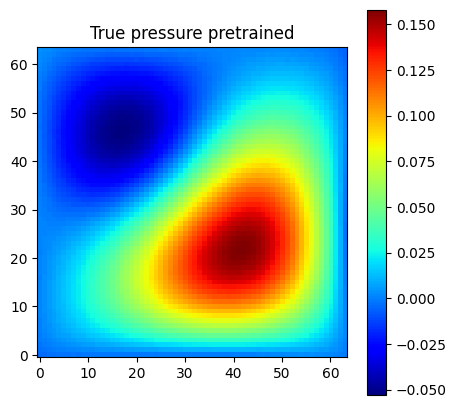

In [17]:

s_pred_i = s_pred[10].reshape(64,64)
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

im1 = axes.imshow(s_pred_i, origin='lower', cmap='jet')
axes.set_title('True pressure pretrained')
plt.colorbar(im1, ax=axes)

In [18]:
"""# Test error function"""

def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * jnp.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

# def multi_gaussian_source(X, Y, params):
#     """
#     params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
#     """
#     n_sources = len(params) // 4
#     f = jnp.zeros_like(X)
    
#     for i in range(n_sources):
#         A = params[4*i]
#         x0 = params[4*i + 1]
#         y0 = params[4*i + 2]
#         sigma = params[4*i + 3]
        
#         f += gaussian_source(X, Y, A, x0, y0, sigma)
    
#     return f

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
    """
    n_sources = len(params) // 3
    f = jnp.zeros_like(X)
    
    for i in range(n_sources):
        A = params[3*i]
        x0 =  params[3*i + 1]
        y0 = params[3*i + 2]
        sigma = 0.2
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f

def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = jnp.linspace(0, 1, n)
    y = jnp.linspace(0, 1, n)
    X, Y = jnp.meshgrid(x, y, indexing="xy")
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec


def loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, full_solution_coordinates, param_test, return_data=False):

    x = full_solution_coordinates[:,0]
    y = full_solution_coordinates[:,1]
    
    params_sol, params_inv = params

    def ff_net(x, y):
        s_pred = apply_net(model_fn, params_sol, X_test, x, y)
        return s_pred

    s_pred = ff_net(x, y)

    loss_test = mse(y_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(y_test, s_pred))

    if return_data:
        
        params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_single)
        # Shape: (1, 6)

        # Extract RAW predictions
        A_mean = params_pred_all[0, 0]
        x0_mean = params_pred_all[0, 2]
        y0_mean = params_pred_all[0, 4]

        # A_logstd = params_pred_all[0, 1]
        # x0_logstd = params_pred_all[0, 3]
        # y0_logstd = params_pred_all[0, 5]
        
        A_std = params_pred_all[0, 1]
        x0_std = params_pred_all[0, 3]
        y0_std = params_pred_all[0, 5]

#         # ===== APPLY TRANSFORMATIONS TO ENFORCE BOUNDS =====
#         # A: [2, 6] -> use sigmoid to map to [0,1] then scale to [2,6]
#         A_mean = 2.0 + 4.0 * jax.nn.sigmoid(A_mean_raw)

#         # x0, y0: [0.35, 0.65] -> use sigmoid then scale to [0.35, 0.65]
#         x0_mean = 0.35 + 0.3 * jax.nn.sigmoid(x0_mean_raw)
#         y0_mean = 0.35 + 0.3 * jax.nn.sigmoid(y0_mean_raw)

# #         # MUCH TIGHTER std caps
#         A_std_raw = jnp.exp(A_logstd)
#         A_std = jnp.minimum(A_std_raw, 0.8)  # Max 0.2 (was 0.4)

#         x0_std_raw = jnp.exp(x0_logstd)
#         x0_std = jnp.minimum(x0_std_raw, 0.08)  # Max 0.02 (was 0.03)

#         y0_std_raw = jnp.exp(y0_logstd)
#         y0_std = jnp.minimum(y0_std_raw, 0.08)  # Max 0.02 (was 0.03)

        # Reparameterization trick: sample all 3 parameters
        key, *subkeys = jax.random.split(key, 4)
        A_sampled = A_mean + jax.random.normal(subkeys[0], shape=()) * A_std
        x0_sampled = x0_mean + jax.random.normal(subkeys[1], shape=()) * x0_std
        y0_sampled = y0_mean + jax.random.normal(subkeys[2], shape=()) * y0_std

        # Reparameterization trick: sample all 3 parameters
        key = jax.random.PRNGKey(42)
        
        key, *subkeys = jax.random.split(key, 4)
        A1_sampled = A1_mean + jax.random.normal(subkeys[0], shape=()) * A1_std
        x0_1_sampled = x0_1_mean + jax.random.normal(subkeys[1], shape=()) * x0_1_std
        y0_1_sampled = y0_1_mean + jax.random.normal(subkeys[2], shape=()) * y0_1_std

        perm_pred_sampled = jnp.stack([A1_sampled, x0_1_sampled, y0_1_sampled], axis=0)
        
        perm_pred_sampled = perm_pred_sampled.reshape(1, -1)
        # w1, w2, q1, q2, q3 = perm_pred_all[:,0], perm_pred_all[:,1], perm_pred_all[:,2], perm_pred_all[:,3], perm_pred_all[:,4]
        # w1, w2, q1, q2, q3 = param_test[:,0], param_test[:,1], param_test[:,2], param_test[:,3], param_test[:,4]
        
        source_rec = reconstruct_gaussian_source(perm_pred_sampled)
        
        source_true = reconstruct_gaussian_source(param_test)
        
#         print("perm_pred: ", perm_pred.shape)
#         print("perm_test: ", perm_test.shape)
        # print("w1_t: ", w1_t[0])
        # print("w1: ", w1[0])
        # print("w2_t: ", w2_t[0])
        # print("w2: ", w2[0])
        # print("q1_t: ", q1_t[0])
        # print("q1: ", q1[0])
        # print("q2_t: ", q2_t[0])
        # print("q2: ", q2[0])
        # print("q3_t: ", q3_t[0])
        # print("q3: ", q3[0])
        
        
        l2_error_source = jnp.mean(l2_norm_error(source_true, source_rec))
        
        return loss_test, l2_error, s_pred, source_rec, l2_error_source, source_true, perm_pred_sampled, param_test
    else:
        return loss_test, l2_error

In [19]:
# loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, solutions_xy, param_test, return_data=True)

In [19]:
"""# Define optimiser"""

# Define optimizer with optax (ADAM)
# optimizer

lr_scheduler = optax.exponential_decay(lr, transition_steps, decay_rate)

# lr_scheduler = optax.constant_schedule(1e-3)

optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)

# Data
res_data = iter(res_dataset)
data_data = iter(data_dataset)
bc_data = iter(bc_dataset)

# create dir for saving results
result_dir = os.path.join(os.getcwd(), os.path.join(result_dir, f"inv_dist_op_{seed}"))
log_file = os.path.join(result_dir, 'log.csv')
# Create directory
if not os.path.exists(result_dir):
    os.makedirs(result_dir)
if os.path.exists(os.path.join(result_dir, 'vis')):
    shutil.rmtree(os.path.join(result_dir, 'vis'))
if os.path.exists(log_file):
    os.remove(log_file)


with open(log_file, 'a') as f:
    f.write('epoch,loss,loss_res_value,loss_data_value,loss_bc_value,l2err_test,loss_test,runtime\n')
    # f.write('epoch,loss,loss_res_value,loss_data_value,l2err_test,loss_test,runtime\n')    

In [21]:
"""# Training loop"""

# Iterations
epochs = epochs  # Assuming 'epochs' is defined elsewhere
log_iter = 1000
best_test_mse = float('inf')  # Initialize with infinity
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_best.pkl')
print("Saved initial model at iteration 0")
# Training loop
for it in range(epochs):
    if it == 1:
        # start timer and exclude first iteration (compile time)
        start = time.time()
    # Fetch data
    res_batch = next(res_data)
    data_batch = next(data_data)
    bcs_batch = next(bc_data)
    
    # Do Step
    loss, params, opt_state = step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state,
                                   params, res_batch, data_batch, bcs_batch, key)
    # loss, params, opt_state = step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state,
    #                                params, res_batch, data_batch)
    if it % log_iter == 0:
        # Compute losses
        loss = loss_fn(model_fn, model_inv_fn, params, res_batch, data_batch, bcs_batch, key)
        # loss = loss_fn(model_fn, model_inv_fn, params, res_batch, data_batch)
        loss_res_value = loss_res(model_fn, model_inv_fn, params, res_batch, key)
        loss_data_value = loss_data(model_fn, params, data_batch)
        loss_bc_value = loss_bcs(model_fn, params, bcs_batch)
        
        # Calculate loss and l2 error for test samples
        loss_test, l2_error = loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, solutions_xy, param_test, return_data=False)

        if loss_test < best_test_mse:
            best_test_mse = loss_test
            # Save the model as it's the best so far
            save_model_params(params, result_dir, filename='model_params_best.pkl')
            print(f"New best model saved at iteration {it} with test MSE: {loss_test:.2e}")

        # get runtime
        if it == 0:
            runtime = 0
        else:
            runtime = time.time() - start

        # Print losses
        print(f"Iteration {it+1}/{epochs}")
        print(f"Trian_loss: {loss:.2e}, "
              f"loss_res: {loss_res_value:.2e}, loss_data: {loss_data_value:.2e}, loss_bc: {loss_bc_value:.2e}, l2_err_test: {l2_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")
              # f"loss_res: {loss_res_value:.2e}, loss_data: {loss_data_value:.2e}, l2_err_test: {l2_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")
              

        # Save results
        with open(log_file, 'a') as f:
            f.write(f'{it+1}, {loss},'
                    f'{loss_res_value}, {loss_data_value}, {loss_bc_value}, {l2_error}, {loss_test}, {runtime}\n')
                    # f'{loss_res_value}, {loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')
                    

# Save results
runtime = time.time() - start
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_last.pkl')
print("Saved model at end of training")
with open(log_file, 'a') as f:
    f.write(f'{it + 1}, {loss},'
            f'{loss_res_value}, {loss_data_value}, {loss_bc_value}, {l2_error}, {loss_test}, {runtime}\n')
            # f'{loss_res_value}, {loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')            

Saved initial model at iteration 0
New best model saved at iteration 0 with test MSE: 1.00e-02
Iteration 1/80000
Trian_loss: 1.63e+01, loss_res: 1.60e+01, loss_data: 1.10e-02, loss_bc: 9.26e-02, l2_err_test: 1.12e+00, test_loss: 1.00e-02 , runtime: 000.00
New best model saved at iteration 1000 with test MSE: 1.12e-03
Iteration 1001/80000
Trian_loss: 4.87e-02, loss_res: 2.51e-02, loss_data: 1.11e-03, loss_bc: 1.41e-03, l2_err_test: 3.58e-01, test_loss: 1.12e-03 , runtime: 003.21
Iteration 2001/80000
Trian_loss: 1.46e-01, loss_res: 6.89e-02, loss_data: 3.81e-03, loss_bc: 8.63e-04, l2_err_test: 6.76e-01, test_loss: 3.97e-03 , runtime: 006.24
Iteration 3001/80000
Trian_loss: 9.28e-02, loss_res: 3.05e-02, loss_data: 3.08e-03, loss_bc: 5.98e-04, l2_err_test: 6.25e-01, test_loss: 3.47e-03 , runtime: 009.26
Iteration 4001/80000
Trian_loss: 9.06e-02, loss_res: 2.59e-02, loss_data: 3.19e-03, loss_bc: 9.54e-04, l2_err_test: 5.54e-01, test_loss: 2.74e-03 , runtime: 012.26
Iteration 5001/80000
Tria

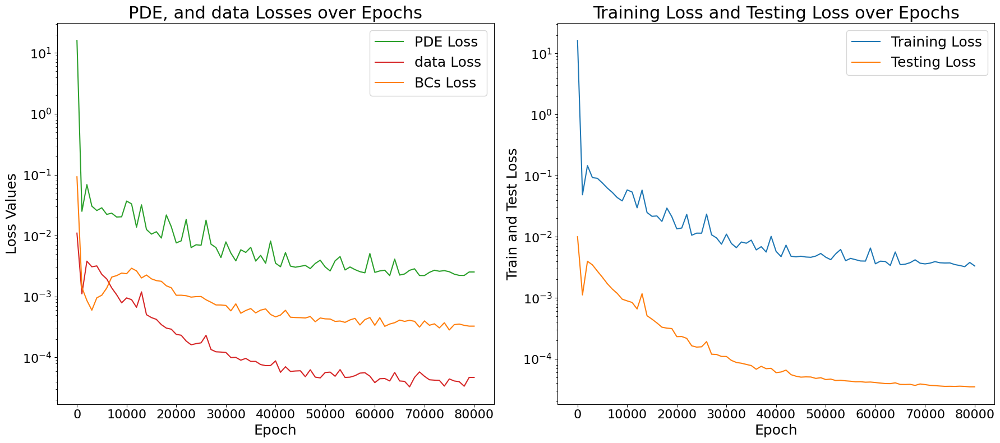

Plots saved to /scratch4/sgoswam4/Dibakar/INV_DON/helmholtz_source_ID/./inv_dist_op_32/train_and_test_loss_plots.png


In [22]:
"""# Loss plots"""

# Read the CSV file
csv_file = os.path.join(result_dir, "log.csv")  # Assuming the file is named "log.csv"
df = pd.read_csv(csv_file)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), dpi=100)

# Set color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Left plot: epoch vs loss_data, and loss_res_value
ax1.plot(df['epoch'], df['loss_res_value'], label='PDE Loss', color=colors[2], linestyle='-')
ax1.plot(df['epoch'], df['loss_data_value'], label='data Loss', color=colors[3], linestyle='-')
ax1.plot(df['epoch'], df['loss_bc_value'], label='BCs Loss', color=colors[1], linestyle='-')


ax1.set_yscale("log")
ax1.set_xlabel('Epoch', fontsize=18)
ax1.set_ylabel('Loss Values', fontsize=18)
ax1.set_title('PDE, and data Losses over Epochs', fontsize=22)
ax1.legend(loc='best', fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Right plot: epoch vs loss and l2err_val
ax2.plot(df['epoch'], df['loss'], label='Training Loss', color=colors[0], linestyle='-')
ax2.plot(df['epoch'], df['loss_test'], label='Testing Loss', color=colors[1], linestyle='-')
ax2.set_yscale("log")
ax2.set_xlabel('Epoch', fontsize=18)
ax2.set_ylabel('Train and Test Loss', fontsize=18)
ax2.set_title('Training Loss and Testing Loss over Epochs', fontsize=22)
ax2.legend(loc='best', fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Adjust layout and save the figure
plt.tight_layout()
output_file = os.path.join(result_dir, "train_and_test_loss_plots.png")
plt.savefig(output_file, dpi=100)
plt.show()
plt.close()

print(f"Plots saved to {output_file}")

In [20]:
params = load_model_params(result_dir, filename='model_params_last.pkl')

# sample = 0
    
# loss_test, l2_error_sol, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, perm_test = loss_test_l2_error(model_fn, model_inv_fn, params, X_test[sample].reshape(1,-1), y_test[sample].reshape(1,-1), solutions_xy, param_test[sample].reshape(1,-1), return_data=True)

In [24]:
# l2_error_sol, l2_error_source, perm_pred_all.shape, perm_test.shape

In [23]:
import numpy as np
from scipy.sparse import diags
from scipy.sparse.linalg import spsolve


# =====================================================
#  Gaussian Source Utilities
# =====================================================

def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source."""
    return A * np.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))


def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, s1, A2, x2, y2, s2, ...]
    """
    n = len(params) // 4
    f = np.zeros_like(X)

    for i in range(n):
        A, x0, y0, s = params[4*i : 4*i + 4]
        f += gaussian_source(X, Y, A, x0, y0, s)

    return f

class HelmholtzSolver:
    """Solve ∇²u + k² u = f on [0,1]² with Dirichlet boundary."""
    
    def __init__(self, n_grid=64, k=np.pi):
        self.n = n_grid
        self.h = 1.0 / (n_grid - 1)
        self.k = k

    def solve(self, source):
        n, h, k = self.n, self.h, self.k
        N = n * n

        # Helmholtz operator L = Δ + k² I
        main = (-4 / h**2 + k**2) * np.ones(N)
        off = (1 / h**2) * np.ones(N - 1)
        off[n - 1::n] = 0  # avoid wrapping
        offy = (1 / h**2) * np.ones(N - n)

        A = diags([main, off, off, offy, offy],
                  [0, 1, -1, n, -n],
                  format="lil")

        b = source.flatten()

        # Dirichlet boundary
        mask = np.zeros((n, n), dtype=bool)
        mask[0, :] = mask[-1, :] = True
        mask[:, 0] = mask[:, -1] = True

        boundary_idx = np.where(mask.flatten())[0]

        for idx in boundary_idx:
            A[idx, :] = 0
            A[idx, idx] = 1
            b[idx] = 0

        u = spsolve(A.tocsr(), b)
        return u.reshape((n, n))

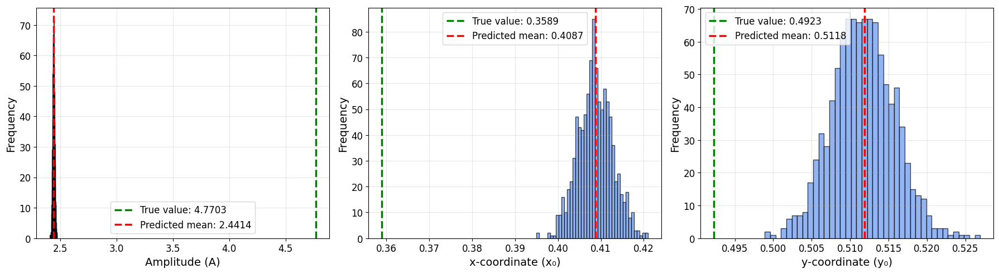


PARAMETER STATISTICS
Parameter       True         Pred Mean    Pred Std     Error       
------------------------------------------------------------
A               4.7703       2.4414       0.0100       2.3290      
x0              0.3589       0.4087       0.0040       0.0498      
y0              0.4923       0.5118       0.0040       0.0195      

X_test_i:  (1024,)
params_pred_all:  (1, 6)


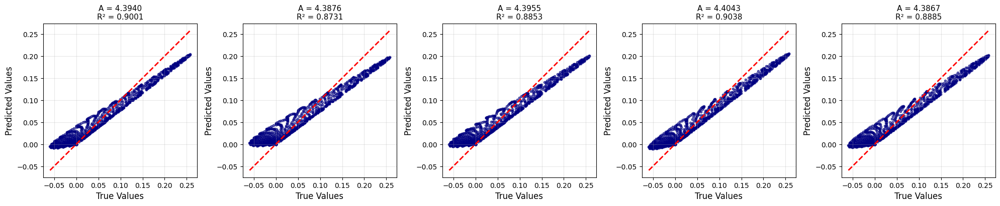


SAMPLED SOLUTIONS STATISTICS
Sample     A            x0           y0           R²          
------------------------------------------------------------
1          4.3940       0.4094       0.4946       0.9001      
2          4.3876       0.4166       0.4946       0.8731      
3          4.3955       0.4134       0.4974       0.8853      
4          4.4043       0.4084       0.4888       0.9038      
5          4.3867       0.4125       0.4895       0.8885      



In [23]:
import numpy as np
import matplotlib.pyplot as plt
import jax.numpy as jnp
import jax
from scipy.stats import norm

def plot_parameter_distributions(model_inv_fn, params_inv, u_data_test, true_params, 
                                 n_samples=1000, save_path=None):
    """
    Plot distributions for A, x0, y0 parameters with true value and predicted mean.
    
    Args:
        model_inv_fn: Inverse model function
        params_inv: Inverse model parameters
        u_data_test: Test sample (shape: (1, latent_dim))
        true_params: True parameter values [A, x0, y0, sigma] or [A, x0, y0]
        n_samples: Number of samples to draw from predicted distribution
        save_path: Path to save the figure
    """
    # Get predicted parameters
    u_data_test = u_data_test[None, :] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)
    # Shape: (1, 6)
    
    # Extract RAW predictions
    A_mean = params_pred_all[0, 0]
    x0_mean = params_pred_all[0, 2]
    y0_mean = params_pred_all[0, 4]
    
    # A_logstd = params_pred_all[0, 1]
    # x0_logstd = params_pred_all[0, 3]
    # y0_logstd = params_pred_all[0, 5]
    
    A_std = params_pred_all[0, 1]
    x0_std = params_pred_all[0, 3]
    y0_std = params_pred_all[0, 5]
    
#     # MUCH TIGHTER std caps
#     A_std_raw = jnp.exp(A_logstd)
#     A_std = jnp.minimum(A_std_raw, 0.8)  # Max 0.2 (was 0.4)
    
#     x0_std_raw = jnp.exp(x0_logstd)
#     x0_std = jnp.minimum(x0_std_raw, 0.08)  # Max 0.02 (was 0.03)
    
#     y0_std_raw = jnp.exp(y0_logstd)
#     y0_std = jnp.minimum(y0_std_raw, 0.08)  # Max 0.02 (was 0.03)

#     # # Reparameterization trick: sample all 3 parameters
#     # key, *subkeys = jax.random.split(key, 4)
#     # A_sampled = A_mean + jax.random.normal(subkeys[0], shape=()) * A_std
#     # x0_sampled = x0_mean + jax.random.normal(subkeys[1], shape=()) * x0_std
#     # y0_sampled = y0_mean + jax.random.normal(subkeys[2], shape=()) * y0_std
    
    # True values
    A_true, x0_true, y0_true = true_params[0], true_params[1], true_params[2]
    
#     # Sample from distributions
#     A_samples = np.random.normal(A_mean, A_std, n_samples)
#     x0_samples = np.random.normal(x0_mean, x0_std, n_samples)
#     y0_samples = np.random.normal(y0_mean, y0_std, n_samples)
    
    # Split keys: one per parameter
    eps_A  = np.random.normal(0, 1, size=n_samples)
    eps_x0 = np.random.normal(0, 1, size=n_samples)
    eps_y0 = np.random.normal(0, 1, size=n_samples)

    # Reparameterization trick
    A_samples  = A_mean  + eps_A  * A_std
    x0_samples = x0_mean + eps_x0 * x0_std
    y0_samples = y0_mean + eps_y0 * y0_std

    # Stack to (n_samples, 3)
    # samples = jnp.stack([A_samples, x0_samples, y0_samples], axis=1)

    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    params_data = [
        (A_samples, A_true, A_mean, 'Amplitude (A)', axes[0]),
        (x0_samples, x0_true, x0_mean, 'x-coordinate (x₀)', axes[1]),
        (y0_samples, y0_true, y0_mean, 'y-coordinate (y₀)', axes[2])
    ]
    
    for samples, true_val, pred_mean, label, ax in params_data:
        # Plot histogram
        ax.hist(samples, bins=40, alpha=0.7, edgecolor='black', color='cornflowerblue')
        
        # Add vertical lines for true value and predicted mean
        ax.axvline(true_val, color='green', linestyle='--', linewidth=2.5, 
                  label=f'True value: {true_val:.4f}')
        ax.axvline(pred_mean, color='red', linestyle='--', linewidth=2.5, 
                  label=f'Predicted mean: {pred_mean:.4f}')
        
        ax.set_xlabel(label, fontsize=14)
        ax.set_ylabel('Frequency', fontsize=14)
        ax.legend(fontsize=12)
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=12)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    # Print statistics
    print("\n" + "="*60)
    print("PARAMETER STATISTICS")
    print("="*60)
    print(f"{'Parameter':<15} {'True':<12} {'Pred Mean':<12} {'Pred Std':<12} {'Error':<12}")
    print("-"*60)
    print(f"{'A':<15} {A_true:<12.4f} {A_mean:<12.4f} {A_std:<12.4f} {abs(A_true-A_mean):<12.4f}")
    print(f"{'x0':<15} {x0_true:<12.4f} {x0_mean:<12.4f} {x0_std:<12.4f} {abs(x0_true-x0_mean):<12.4f}")
    print(f"{'y0':<15} {y0_true:<12.4f} {y0_mean:<12.4f} {y0_std:<12.4f} {abs(y0_true-y0_mean):<12.4f}")
    print("="*60 + "\n")


def plot_sampled_solutions(model_inv_fn, params_inv, u_data_test,
                          n_samples=5, n_grid=64, save_path=None):
    """
    Sample parameters from predicted distribution, run FDM solver, and compare with true solution.
    
    Args:
        model_inv_fn: Inverse model function
        params_inv: Inverse model parameters
        u_data_test: Test sample (shape: (1, latent_dim))
        true_solution_32x32: True solution at 32x32 sensor locations
        n_samples: Number of samples to draw and plot
        n_grid: Grid size for FDM solver (64)
        save_path: Path to save the figure
    """
    # Get predicted parameters
    u_data_test = u_data_test[None, :] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)
    # Shape: (1, 6)
    
    print("params_pred_all: ", params_pred_all.shape)
    # Extract RAW predictions
    A_mean = params_pred_all[0, 0]
    x0_mean = params_pred_all[0, 2]
    y0_mean = params_pred_all[0, 4]
    
    # A_logstd = params_pred_all[0, 1]
    # x0_logstd = params_pred_all[0, 3]
    # y0_logstd = params_pred_all[0, 5]
    
    A_std = params_pred_all[0, 1]
    x0_std = params_pred_all[0, 3]
    y0_std = params_pred_all[0, 5]
    
#     # ===== APPLY TRANSFORMATIONS TO ENFORCE BOUNDS =====
#     # A: [2, 6] -> use sigmoid to map to [0,1] then scale to [2,6]
#     A_mean = 2.0 + 4.0 * jax.nn.sigmoid(A_mean_raw)
    
#     # x0, y0: [0.35, 0.65] -> use sigmoid then scale to [0.35, 0.65]
#     x0_mean = 0.35 + 0.3 * jax.nn.sigmoid(x0_mean_raw)
#     y0_mean = 0.35 + 0.3 * jax.nn.sigmoid(y0_mean_raw)
    
#     # MUCH TIGHTER std caps
#     A_std_raw = jnp.exp(A_logstd)
#     A_std = jnp.minimum(A_std_raw, 0.8)  # Max 0.2 (was 0.4)
    
#     x0_std_raw = jnp.exp(x0_logstd)
#     x0_std = jnp.minimum(x0_std_raw, 0.08)  # Max 0.02 (was 0.03)
    
#     y0_std_raw = jnp.exp(y0_logstd)
#     y0_std = jnp.minimum(y0_std_raw, 0.08)  # Max 0.02 (was 0.03)

#     # Reparameterization trick: sample all 3 parameters
#     key, *subkeys = jax.random.split(key, 4)
#     A_sampled = A_mean + jax.random.normal(subkeys[0], shape=()) * A_std
#     x0_sampled = x0_mean + jax.random.normal(subkeys[1], shape=()) * x0_std
#     y0_sampled = y0_mean + jax.random.normal(subkeys[2], shape=()) * y0_std
    
    # Sample parameters
    np.random.seed(42)  # For reproducibility
    A_samples = np.random.normal(A_mean, A_std, n_samples)
    x0_samples = np.random.normal(x0_mean, x0_std, n_samples)
    y0_samples = np.random.normal(y0_mean, y0_std, n_samples)
    # key = jax.random.PRNGKey(42)
    
#     eps_A  = np.random.normal(0, 1, size=n_samples)
#     eps_x0 = np.random.normal(0, 1, size=n_samples)
#     eps_y0 = np.random.normal(0, 1, size=n_samples)

#     # Reparameterization trick
#     A_samples  = A_mean  + eps_A  * A_std
#     x0_samples = x0_mean + eps_x0 * x0_std
#     y0_samples = y0_mean + eps_y0 * y0_std

    # Initialize solver
    solver = HelmholtzSolver(n_grid=n_grid, k=2*np.pi)
    
    # Create meshgrid for source
    x = np.linspace(0, 1, n_grid)
    y = np.linspace(0, 1, n_grid)
    X, Y = np.meshgrid(x, y)
    
    # Get 32x32 sensor indices
    sensor_idx = np.linspace(0, n_grid - 1, 32).astype(int)
    
    # Flatten true solution for comparison
    # true_flat = true_solution_32x32.flatten()
    
    true_flat = u_data_test
    
    # Create subplots
    fig, axes = plt.subplots(1, n_samples, figsize=(4*n_samples, 4))
    if n_samples == 1:
        axes = [axes]
    
    for i, ax in enumerate(axes):
        # Sample parameters
        A_i = A_samples[i]
        x0_i = x0_samples[i]
        y0_i = y0_samples[i]
        sigma = 0.2
        
        # Generate source
        source_i = gaussian_source(X, Y, A_i, x0_i, y0_i, sigma)
        
        # Solve PDE
        solution_i = solver.solve(source_i)
        
        # Extract at 32x32 sensor locations
        solution_32x32_i = solution_i[np.ix_(sensor_idx, sensor_idx)]
        pred_flat = solution_32x32_i.flatten()
        
#         fig, axes = plt.subplots(1, 1, figsize=(5, 5))

#         im1 = axes.imshow(solution_32x32_i, origin='lower', cmap='jet')
#         axes.set_title('solution_32x32_i')
#         plt.colorbar(im1, ax=axes)
        
#         fig, axes = plt.subplots(1, 1, figsize=(5, 5))

#         im1 = axes.imshow(true_flat.reshape(32, 32), origin='lower', cmap='jet')
#         axes.set_title('u_data')
#         plt.colorbar(im1, ax=axes)
        
        
        # Compute R²
        ss_res = np.sum((true_flat - pred_flat)**2)
        ss_tot = np.sum((true_flat - np.mean(true_flat))**2)
        r2 = 1 - (ss_res / ss_tot)
        
        # Plot
        ax.scatter(true_flat, pred_flat, alpha=0.6, s=10, color='navy')
        
        # Perfect prediction line
        min_val = min(true_flat.min(), pred_flat.min())
        max_val = max(true_flat.max(), pred_flat.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2)
        
        # Labels and title
        ax.set_xlabel('True Values', fontsize=12)
        ax.set_ylabel('Predicted Values', fontsize=12)
        ax.set_title(f'A = {A_i:.4f}\nR² = {r2:.4f}', fontsize=11)
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    # Print sample statistics
    print("\n" + "="*60)
    print("SAMPLED SOLUTIONS STATISTICS")
    print("="*60)
    print(f"{'Sample':<10} {'A':<12} {'x0':<12} {'y0':<12} {'R²':<12}")
    print("-"*60)
    
    for i in range(n_samples):
        A_i = A_samples[i]
        x0_i = x0_samples[i]
        y0_i = y0_samples[i]
        
        source_i = gaussian_source(X, Y, A_i, x0_i, y0_i, 0.2)
        solution_i = solver.solve(source_i)
        solution_32x32_i = solution_i[np.ix_(sensor_idx, sensor_idx)]
        pred_flat = solution_32x32_i.flatten()
        
        ss_res = np.sum((true_flat - pred_flat)**2)
        ss_tot = np.sum((true_flat - np.mean(true_flat))**2)
        r2 = 1 - (ss_res / ss_tot)
        
        print(f"{i+1:<10} {A_i:<12.4f} {x0_i:<12.4f} {y0_i:<12.4f} {r2:<12.4f}")
    
    print("="*60 + "\n")



params_sol, params_inv = params

# Select a test sample (e.g., sample index 0)
test_idx = 18

# True parameters and solution
true_params = param_test[test_idx]
# true_solution_32x32 = data["sensor_32x32"][test_idx]
X_test_i = X_test[test_idx]

# Plot 1: Parameter distributions
plot_parameter_distributions(
    model_inv_fn, params_inv, X_test, true_params,
    n_samples=1000,
    save_path="parameter_distributions.png"
)

print("X_test_i: ", X_test_i.shape)
# print("true_solution_32x32: ", true_solution_32x32.shape)

# Plot 2: Sampled solutions
plot_sampled_solutions(
    model_inv_fn, params_inv, X_test_i,
    n_samples=5,
    n_grid=64,
    save_path="sampled_solutions.png"
)

Random sample indices: [147 104  54 128  67 151  60  25  62 131]

--- Plotting sample 1 (test index = 147) ---
X_test_i: (1024,)
true_params_i: [2.448193   0.5237448  0.40311074]


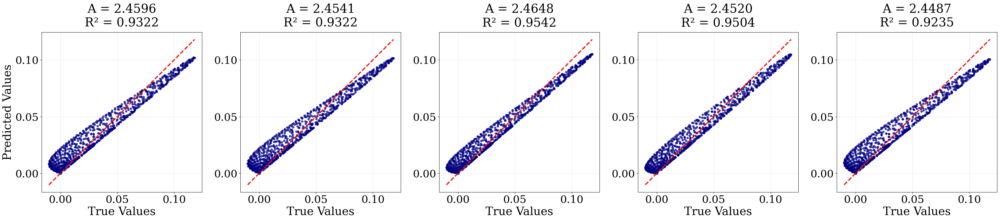


--- Plotting sample 2 (test index = 104) ---
X_test_i: (1024,)
true_params_i: [4.899886   0.55755043 0.3851512 ]


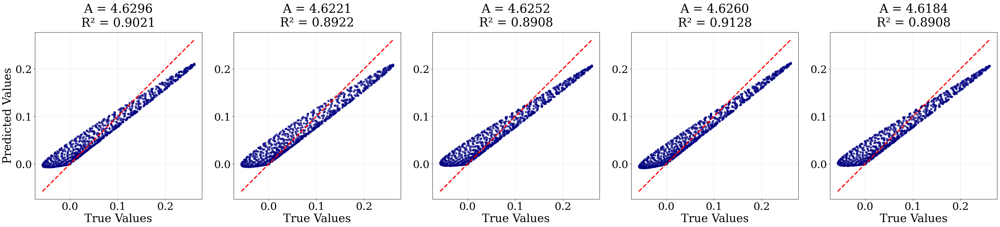


--- Plotting sample 3 (test index = 54) ---
X_test_i: (1024,)
true_params_i: [4.313565   0.53111744 0.5386658 ]


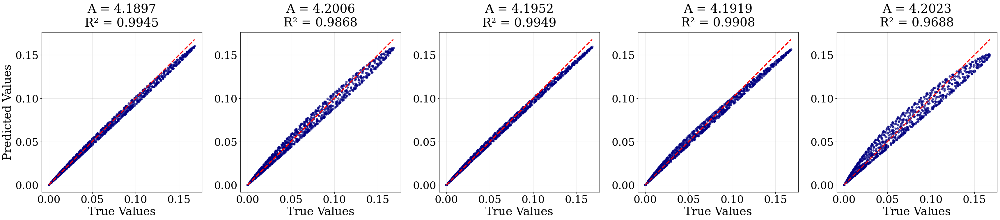


--- Plotting sample 4 (test index = 128) ---
X_test_i: (1024,)
true_params_i: [3.231345  0.5957993 0.5705847]


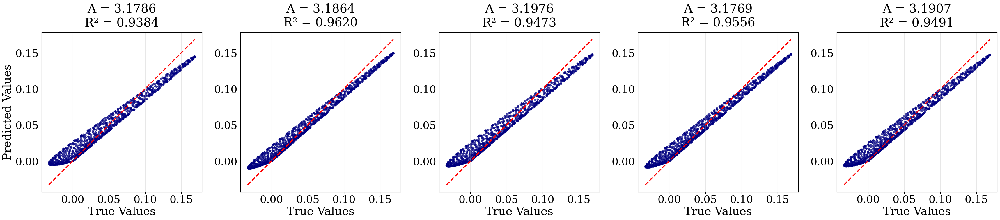


--- Plotting sample 5 (test index = 67) ---
X_test_i: (1024,)
true_params_i: [4.2687626 0.3696649 0.4897651]


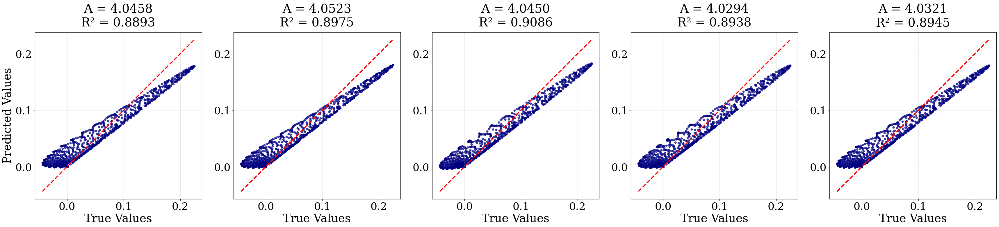


--- Plotting sample 6 (test index = 151) ---
X_test_i: (1024,)
true_params_i: [5.4023414  0.57592285 0.45363906]


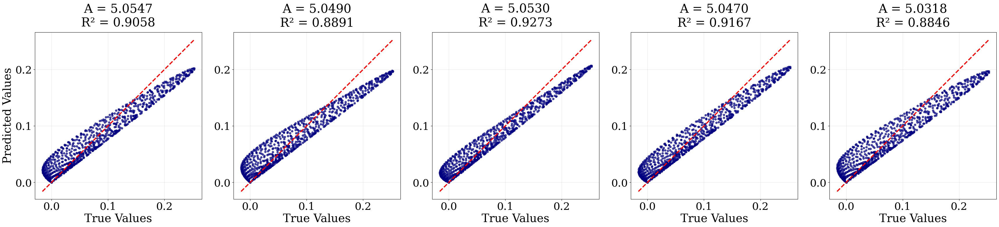


--- Plotting sample 7 (test index = 60) ---
X_test_i: (1024,)
true_params_i: [3.2786472  0.6215685  0.37276816]


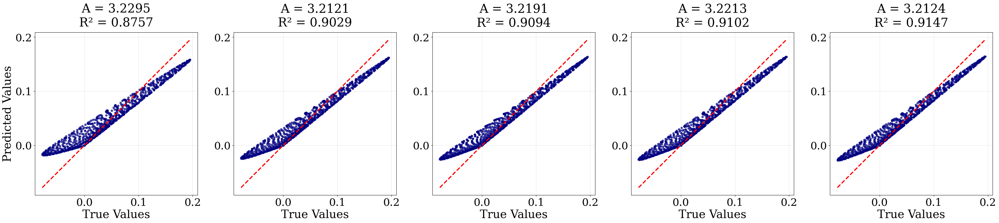


--- Plotting sample 8 (test index = 25) ---
X_test_i: (1024,)
true_params_i: [3.3480492 0.5440049 0.5032501]


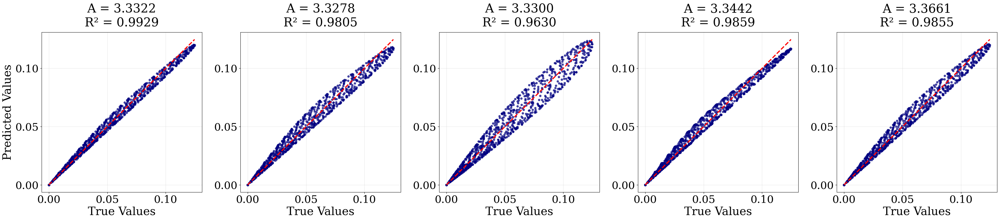


--- Plotting sample 9 (test index = 62) ---
X_test_i: (1024,)
true_params_i: [5.9370213  0.60874975 0.5696239 ]


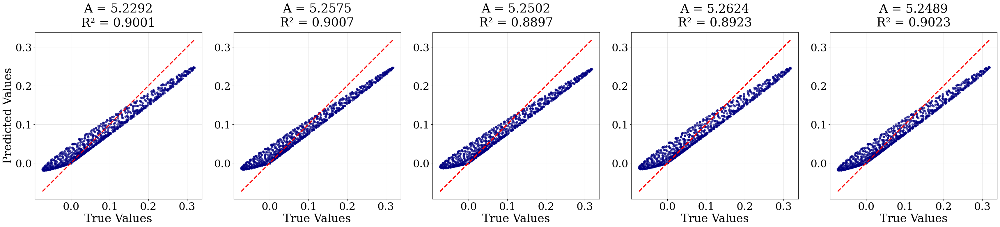


--- Plotting sample 10 (test index = 131) ---
X_test_i: (1024,)
true_params_i: [5.769074  0.6020815 0.5968316]


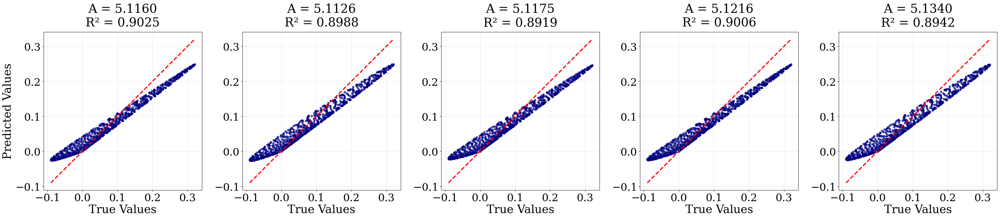


--- Parameter distribution for sample 1 (test index = 147) ---


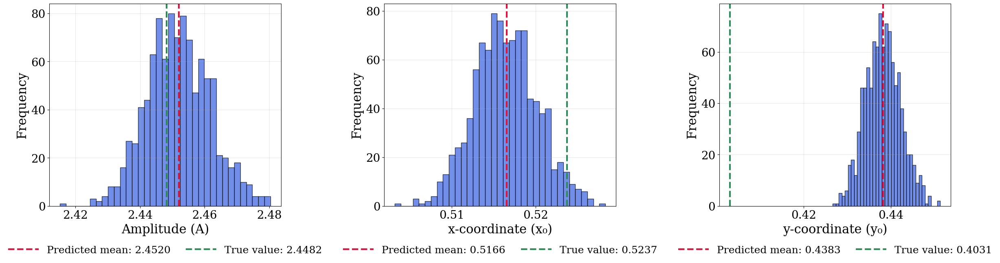


--- Parameter distribution for sample 2 (test index = 104) ---


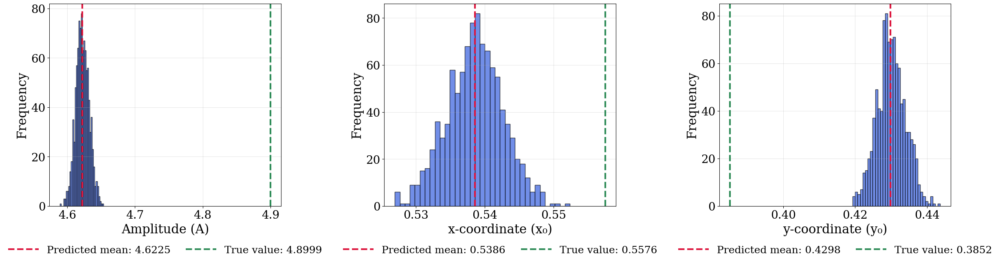


--- Parameter distribution for sample 3 (test index = 54) ---


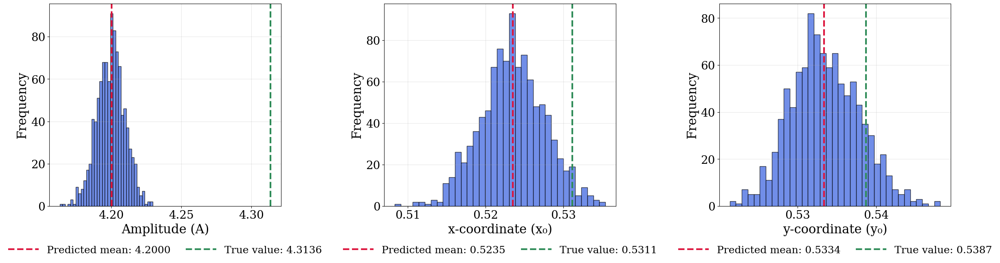


--- Parameter distribution for sample 4 (test index = 128) ---


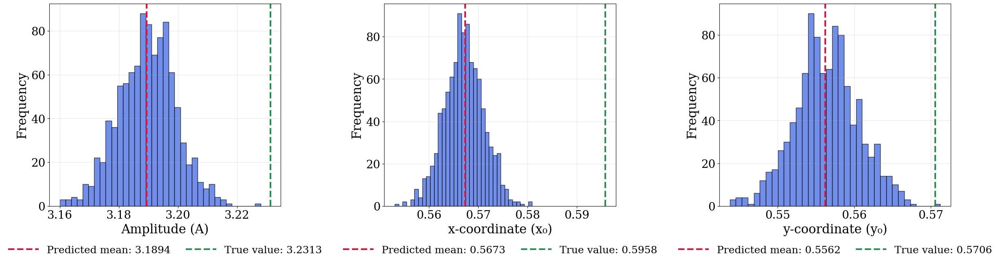


--- Parameter distribution for sample 5 (test index = 67) ---


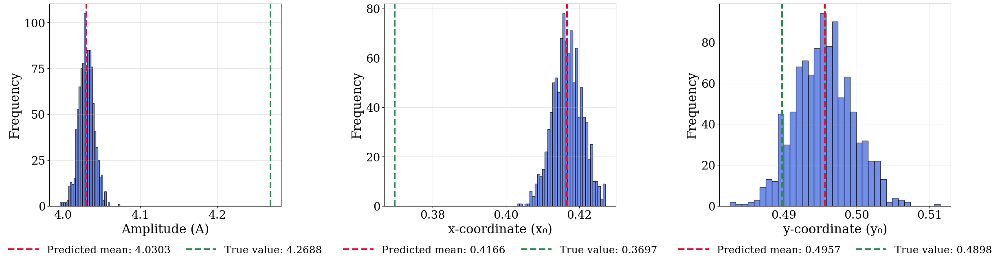


--- Parameter distribution for sample 6 (test index = 151) ---


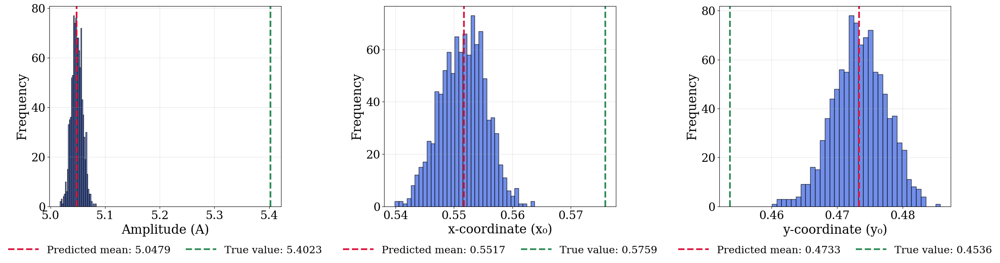


--- Parameter distribution for sample 7 (test index = 60) ---


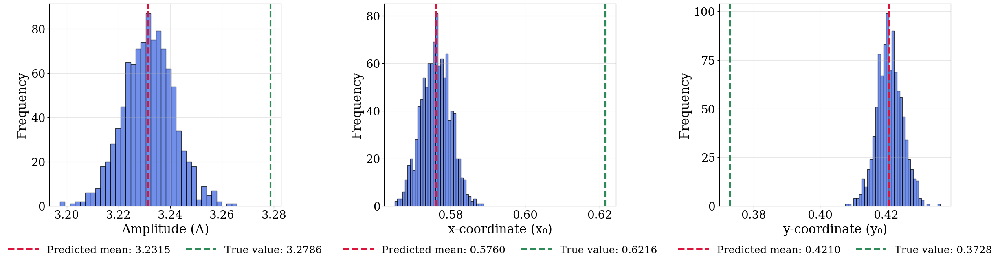


--- Parameter distribution for sample 8 (test index = 25) ---


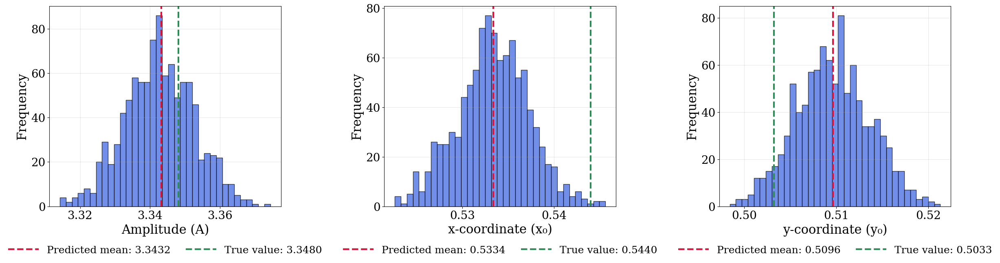


--- Parameter distribution for sample 9 (test index = 62) ---


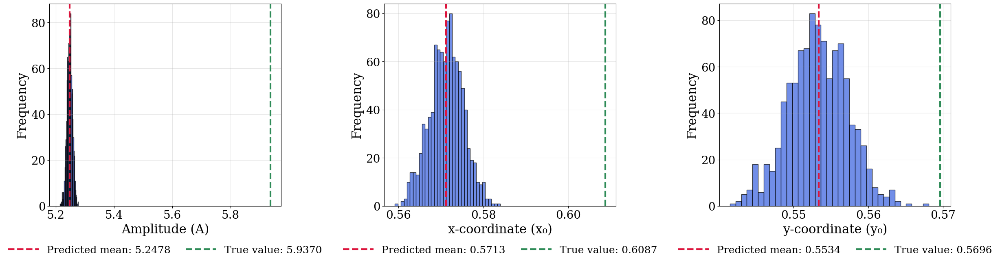


--- Parameter distribution for sample 10 (test index = 131) ---


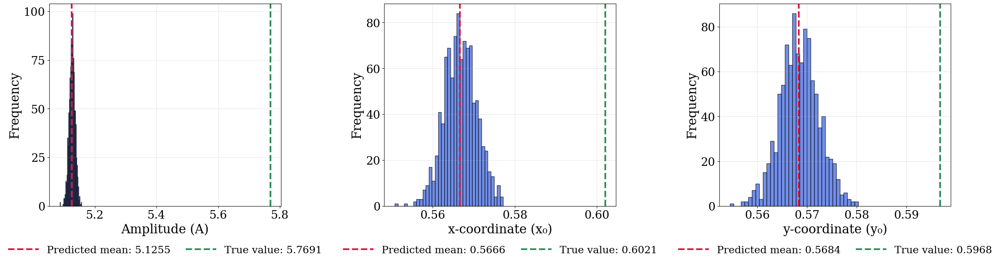

In [31]:
import numpy as np

# ============================================================
# Plot sampled solutions for 10 random test samples
# ============================================================

# Choose how many random samples you want
num_random_samples = 10

# Randomly choose indices from the test set
rand_indices = np.random.choice(len(X_test), size=num_random_samples, replace=False)

print("Random sample indices:", rand_indices)

for i, idx in enumerate(rand_indices):

    print(f"\n--- Plotting sample {i+1} (test index = {idx}) ---")

    X_test_i = X_test[idx]
    true_params_i = param_test[idx]

    print("X_test_i:", X_test_i.shape)
    print("true_params_i:", true_params_i)

    # Save path is unique per sample
    save_path_sample = f"sampled_solutions_sample_{idx}.png"

    # Call your existing plotting function
    plot_sampled_solutions(
        model_inv_fn,
        params_inv,
        X_test_i,
        n_samples=5,       # number of posterior samples of the solution
        n_grid=64,
        save_path_sample
    )

    
# ============================================================
# Plot parameter distributions for the same 10 samples
# ============================================================

for i, idx in enumerate(rand_indices):

    print(f"\n--- Parameter distribution for sample {i+1} (test index = {idx}) ---")

    X_test_i = X_test[idx]
    true_params_i = param_test[idx]

    save_path_param = f"parameter_distribution_sample_{idx}.png"

    plot_parameter_distributions(
        model_inv_fn,
        params_inv,
        X_test_i[None, ...],   # single sample, keep batch dim
        true_params_i,
        n_samples=1000,
        save_path_param
    )


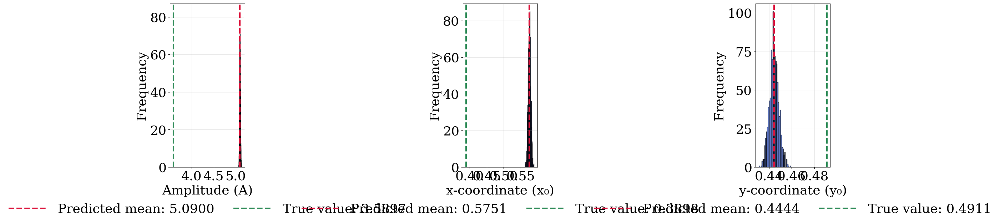

X_test_i:  (1024,)


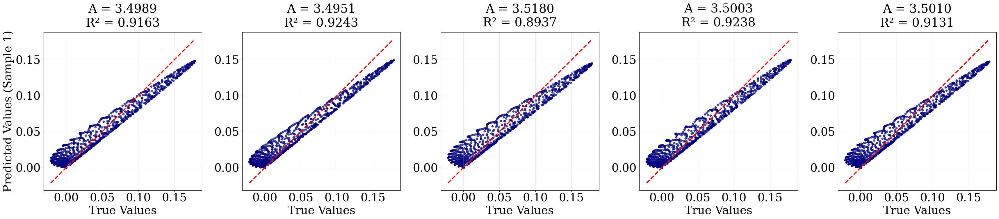

In [23]:
def plot_parameter_distributions(model_inv_fn, params_inv, u_data_test, true_params, 
                                 n_samples=1000, save_path=None):

    # ============================
    #  Font + style settings
    # ============================
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
        "axes.labelsize": 26,
        "font.size": 26,
        "legend.fontsize": 26,
        "xtick.labelsize": 26,
        "ytick.labelsize": 26,
    })

    # Predict
    u_data_test = u_data_test[None, :] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)

    A_mean = float(params_pred_all[0, 0])
    x0_mean = float(params_pred_all[0, 2])
    y0_mean = float(params_pred_all[0, 4])

    A_std = float(params_pred_all[0, 1])
    x0_std = float(params_pred_all[0, 3])
    y0_std = float(params_pred_all[0, 5])

    A_true  = float(true_params[0])
    x0_true = float(true_params[1])
    y0_true = float(true_params[2])

    # Samples (reparam)
    eps = np.random.normal(0, 1, (n_samples, 3))
    A_samples  = A_mean  + A_std  * eps[:, 0]
    x0_samples = x0_mean + x0_std * eps[:, 1]
    y0_samples = y0_mean + y0_std * eps[:, 2]

    fig, axes = plt.subplots(1, 3, figsize=(25, 7))
    labels = ["Amplitude (A)", "x-coordinate (x₀)", "y-coordinate (y₀)"]
    sample_sets = [(A_samples, A_true, A_mean),
                   (x0_samples, x0_true, x0_mean),
                   (y0_samples, y0_true, y0_mean)]

    for ax, (samples, tval, pmean), lab in zip(axes, sample_sets, labels):

        ax.hist(samples, bins=35, alpha=0.75,
                color="royalblue", edgecolor="black")

        ax.axvline(pmean, color="crimson", linestyle="--",
                   linewidth=3, label=f"Predicted mean: {pmean:.4f}")

        ax.axvline(tval, color="seagreen", linestyle="--",
                   linewidth=3, label=f"True value: {tval:.4f}")

        ax.set_xlabel(lab)
        ax.set_ylabel("Frequency")
        ax.grid(alpha=0.3)
        ax.locator_params(axis="x", nbins=5)
        ax.locator_params(axis="y", nbins=5)

        ax.legend(
            frameon=False,
            loc="upper center",
            bbox_to_anchor=(0.5, -0.15),
            ncol=2,
            fontsize=26,
            columnspacing=1.5,
            handlelength=3
        )

    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path.replace(".png","")+".png", dpi=600, bbox_inches="tight")
        plt.savefig(save_path.replace(".png","")+".pdf", dpi=600, bbox_inches="tight")

    plt.show()

def plot_sampled_solutions(model_inv_fn, params_inv, u_data_test,
                          n_samples=5, n_grid=64, save_path=None):

    # =======================================
    # Style
    # =======================================
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
        "axes.labelsize": 28,
        "font.size": 28,
        "legend.fontsize": 28,
        "xtick.labelsize": 28,
        "ytick.labelsize": 28
    })

    # Predict
    u_data_test = u_data_test[None,:] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)

    A_mean = float(params_pred_all[0,0])
    x0_mean = float(params_pred_all[0,2])
    y0_mean = float(params_pred_all[0,4])
    A_std = float(params_pred_all[0,1])
    x0_std = float(params_pred_all[0,3])
    y0_std = float(params_pred_all[0,5])

    # Samples (5)
    eps = np.random.normal(0, 1, (n_samples,3))
    A_samples  = A_mean  + A_std  * eps[:,0]
    x0_samples = x0_mean + x0_std * eps[:,1]
    y0_samples = y0_mean + y0_std * eps[:,2]

    solver = HelmholtzSolver(n_grid=n_grid, k=2*np.pi)

    # Meshgrid
    x = np.linspace(0,1,n_grid)
    y = np.linspace(0,1,n_grid)
    X, Y = np.meshgrid(x,y)
    sensor_idx = np.linspace(0,n_grid-1,32).astype(int)

    true_flat = u_data_test.flatten()

    # =======================================
    # Figure layout
    # =======================================
    fig, axes = plt.subplots(1, n_samples, figsize=(7*n_samples, 8))
    axes = axes.flatten()

    for i in range(n_samples):
        A_i, x_i, y_i = A_samples[i], x0_samples[i], y0_samples[i]

        source_i = gaussian_source(X, Y, A_i, x_i, y_i, sigma=0.2)
        sol = solver.solve(source_i)
        sol32 = sol[np.ix_(sensor_idx, sensor_idx)].flatten()

        ss_res = np.sum((true_flat - sol32)**2)
        ss_tot = np.sum((true_flat - np.mean(true_flat))**2)
        r2 = 1 - ss_res/ss_tot

        ax = axes[i]
        ax.scatter(true_flat, sol32, color="navy", s=22, alpha=0.7)
        ax.plot([true_flat.min(), true_flat.max()],
                [true_flat.min(), true_flat.max()],
                "r--", linewidth=2.8)

        title = f"A = {A_i:.4f}\nR² = {r2:.4f}"
        ax.set_title(title, fontsize=30, pad=14)

        ax.set_xlabel("True Values")
        if i == 0:
            ax.set_ylabel(f"Predicted Values (Sample {i+1})")
        else:
            ax.set_ylabel("")

        ax.grid(alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
        ax.locator_params(axis="x", nbins=5)
        ax.locator_params(axis="y", nbins=5)

    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path.replace(".png","")+".png", dpi=600, bbox_inches="tight")
        plt.savefig(save_path.replace(".png","")+".pdf", dpi=600, bbox_inches="tight")

    plt.show()

params_sol, params_inv = params

# Select a test sample (e.g., sample index 0)
test_idx = 56

# True parameters and solution
true_params = param_test[test_idx]
# true_solution_32x32 = data["sensor_32x32"][test_idx]
X_test_i = X_test[test_idx]

# Plot 1: Parameter distributions
plot_parameter_distributions(
    model_inv_fn, params_inv, X_test, true_params,
    n_samples=1000,
    save_path="parameter_distributions.png"
)

print("X_test_i: ", X_test_i.shape)
# print("true_solution_32x32: ", true_solution_32x32.shape)

# Plot 2: Sampled solutions
plot_sampled_solutions(
    model_inv_fn, params_inv, X_test_i,
    n_samples=5,
    n_grid=64,
    save_path="sampled_solutions.png"
)

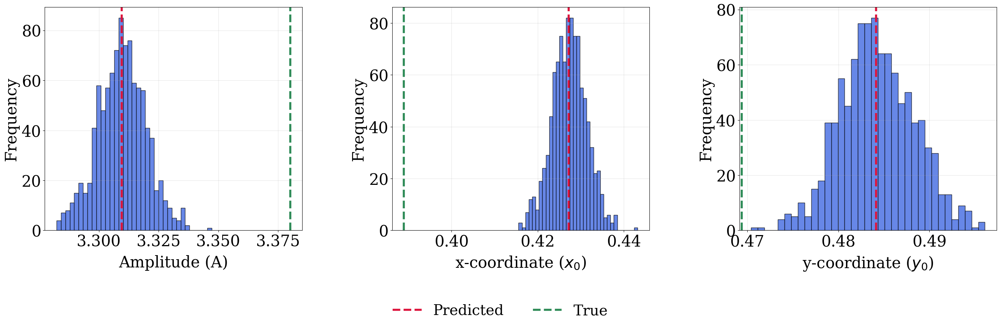

X_test_i:  (1024,)


NameError: name 'HelmholtzSolver' is not defined

In [22]:
def plot_parameter_distributions(model_inv_fn, params_inv, u_data_test, true_params, 
                                 n_samples=1000, save_path=None):

    # Global style
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
        "axes.labelsize": 30,
        "font.size": 30,
        "legend.fontsize": 30,
        "xtick.labelsize": 30,
        "ytick.labelsize": 30,
    })

    # Predict
    u_data_test = u_data_test[None, :] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)

    A_mean = float(params_pred_all[0, 0])
    x0_mean = float(params_pred_all[0, 2])
    y0_mean = float(params_pred_all[0, 4])

    A_std = float(params_pred_all[0, 1])
    x0_std = float(params_pred_all[0, 3])
    y0_std = float(params_pred_all[0, 5])

    A_true  = float(true_params[0])
    x0_true = float(true_params[1])
    y0_true = float(true_params[2])

    # Samples
    eps = np.random.normal(0, 1, (n_samples, 3))
    A_samples  = A_mean  + A_std  * eps[:, 0]
    x0_samples = x0_mean + x0_std * eps[:, 1]
    y0_samples = y0_mean + y0_std * eps[:, 2]

    fig, axes = plt.subplots(
        1, 3, 
        figsize=(33, 10),
        constrained_layout=False
    )

    plt.subplots_adjust(
        wspace=0.35,
        hspace=0.20,
        bottom=0.28                    # space for 1 global legend
    )

    labels = ["Amplitude (A)", "x-coordinate ($x_0$)", "y-coordinate ($y_0$)"]
    sample_sets = [
        (A_samples, A_true, A_mean),
        (x0_samples, x0_true, x0_mean),
        (y0_samples, y0_true, y0_mean),
    ]

    # Prepare proxy lines for global legend
    import matplotlib.lines as mlines
    pred_proxy = mlines.Line2D([], [], color="crimson", linestyle="--", linewidth=4)
    true_proxy = mlines.Line2D([], [], color="seagreen", linestyle="--", linewidth=4)

    for ax, (samples, tval, pmean), lab in zip(axes, sample_sets, labels):

        ax.hist(samples, bins=35, alpha=0.8,
                color="royalblue", edgecolor="black")

        # Vertical lines for predicted mean and true value
        ax.axvline(pmean, color="crimson", linestyle="--", linewidth=4)
        ax.axvline(tval,  color="seagreen", linestyle="--", linewidth=4)

        ax.set_xlabel(lab, labelpad=10)
        ax.set_ylabel("Frequency")
        ax.grid(alpha=0.3)

    # Single global legend for all 3 plots
    fig.legend(
        [pred_proxy, true_proxy],
        ["Predicted", "True"],
        loc="lower center",
        ncol=2,
        frameon=False,
        fontsize=28,
        columnspacing=2.0,
        handlelength=2.0
    )

    if save_path is not None:
        plt.savefig(save_path.replace(".png","")+".png", dpi=450, bbox_inches="tight")
        plt.savefig(save_path.replace(".png","")+".pdf", dpi=450, bbox_inches="tight")

    plt.show()

def plot_sampled_solutions(model_inv_fn, params_inv, u_data_test,
                          n_samples=5, n_grid=64, save_path=None):

    # Style
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
        "axes.labelsize": 36,
        "font.size": 36,
        "legend.fontsize": 36,
        "xtick.labelsize": 36,
        "ytick.labelsize": 36
    })

    u_data_test = u_data_test[None,:] if u_data_test.ndim == 1 else u_data_test
    params_pred_all = apply_net_k(model_inv_fn, params_inv, u_data_test)

    A_mean = float(params_pred_all[0,0])
    x0_mean = float(params_pred_all[0,2])
    y0_mean = float(params_pred_all[0,4])
    A_std = float(params_pred_all[0,1])
    x0_std = float(params_pred_all[0,3])
    y0_std = float(params_pred_all[0,5])

    # Samples
    eps = np.random.normal(0, 1, (n_samples,3))
    A_samples  = A_mean  + A_std  * eps[:,0]
    x0_samples = x0_mean + x0_std * eps[:,1]
    y0_samples = y0_mean + y0_std * eps[:,2]

    solver = HelmholtzSolver(n_grid=n_grid, k=2*np.pi)

    # Meshgrid
    x = np.linspace(0,1,n_grid)
    y = np.linspace(0,1,n_grid)
    X, Y = np.meshgrid(x,y)
    sensor_idx = np.linspace(0,n_grid-1,32).astype(int)

    true_flat = u_data_test.flatten()

    # Wider & taller figure
    fig, axes = plt.subplots(
        1, n_samples, 
        figsize=(8.5*n_samples, 10),
        constrained_layout=False
    )

    plt.subplots_adjust(wspace=0.30, hspace=0.25)

    for i in range(n_samples):
        A_i, x_i, y_i = A_samples[i], x0_samples[i], y0_samples[i]

        source_i = gaussian_source(X, Y, A_i, x_i, y_i, sigma=0.2)
        sol = solver.solve(source_i)
        sol32 = sol[np.ix_(sensor_idx, sensor_idx)].flatten()

        ss_res = np.sum((true_flat - sol32)**2)
        ss_tot = np.sum((true_flat - np.mean(true_flat))**2)
        r2 = 1 - ss_res/ss_tot

        ax = axes[i]
        ax.scatter(true_flat, sol32, color="navy", s=35, alpha=0.7)
        ax.plot(
            [true_flat.min(), true_flat.max()],
            [true_flat.min(), true_flat.max()],
            "r--", linewidth=3
        )

        title = f"A = {A_i:.4f}\nR² = {r2:.4f}"
        ax.set_title(title, fontsize=36, pad=16)

        ax.set_xlabel("True Values", labelpad=8)
        if i == 0:
            # ax.set_ylabel(f"Predicted Values (Sample {i+1})", labelpad=8)
            ax.set_ylabel(f"Predicted Values", labelpad=8)
            
        else:
            ax.set_ylabel("")

        ax.grid(alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
        ax.locator_params(axis="x", nbins=5)
        ax.locator_params(axis="y", nbins=5)

    if save_path is not None:
        plt.savefig(save_path.replace(".png","")+".png", dpi=450, bbox_inches="tight")
        plt.savefig(save_path.replace(".png","")+".pdf", dpi=450, bbox_inches="tight")

    plt.show()

params_sol, params_inv = params

# Select a test sample (e.g., sample index 0)
test_idx = 0

# True parameters and solution
true_params = param_test[test_idx]
# true_solution_32x32 = data["sensor_32x32"][test_idx]
X_test_i = X_test[test_idx]

# Plot 1: Parameter distributions
plot_parameter_distributions(
    model_inv_fn, params_inv, X_test, true_params,
    n_samples=1000,
    save_path="parameter_distributions.png"
)

print("X_test_i: ", X_test_i.shape)
# print("true_solution_32x32: ", true_solution_32x32.shape)

# Plot 2: Sampled solutions
plot_sampled_solutions(
    model_inv_fn, params_inv, X_test_i,
    n_samples=5,
    n_grid=64,
    save_path="sampled_solutions.png"
)

Saving all images to: paper_plots_dist
Random sample indices: [ 18 110 151  74   7   0 113  61 105 101]

--- Plotting sample 1 (test index = 18) ---
X_test_i: (1024,)
true_params_i: [3.2697868  0.4276131  0.59830403]


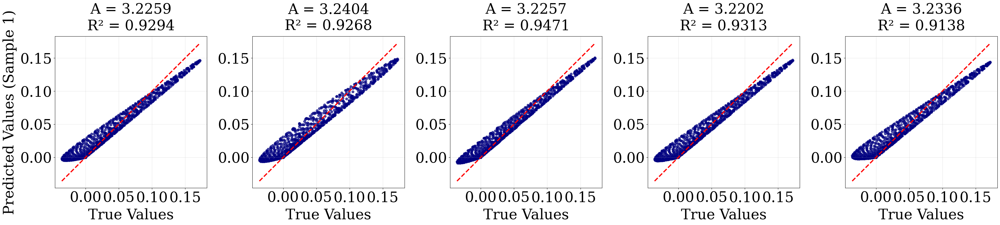


--- Plotting sample 2 (test index = 110) ---
X_test_i: (1024,)
true_params_i: [3.231345  0.5957993 0.5705847]


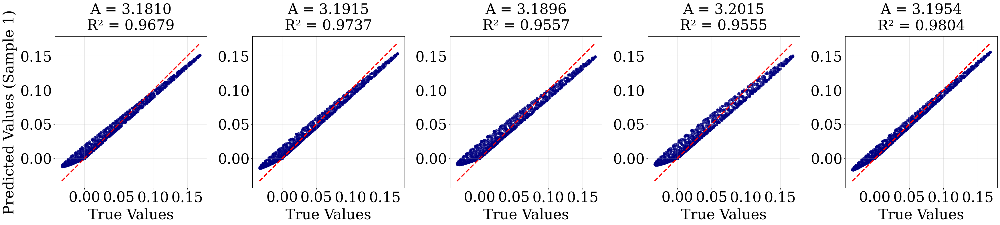


--- Plotting sample 3 (test index = 151) ---
X_test_i: (1024,)
true_params_i: [5.021935   0.40887356 0.46590889]


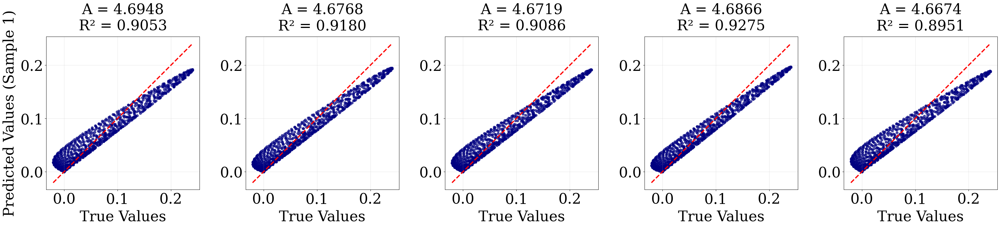


--- Plotting sample 4 (test index = 74) ---
X_test_i: (1024,)
true_params_i: [4.931966  0.5336495 0.6165398]


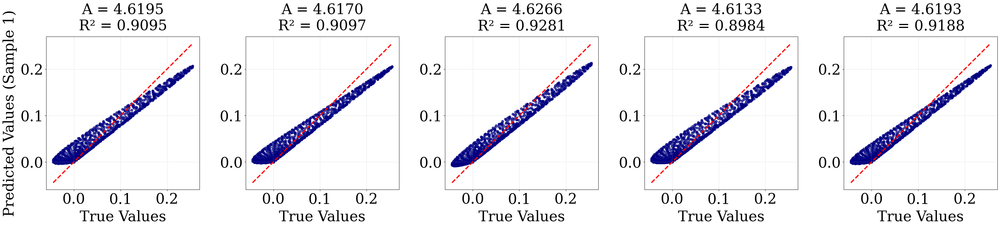


--- Plotting sample 5 (test index = 7) ---
X_test_i: (1024,)
true_params_i: [5.314383  0.6106342 0.5973561]


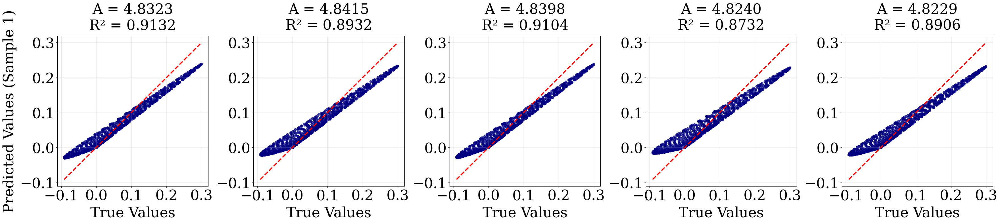


--- Plotting sample 6 (test index = 0) ---
X_test_i: (1024,)
true_params_i: [3.85647   0.5201394 0.5269705]


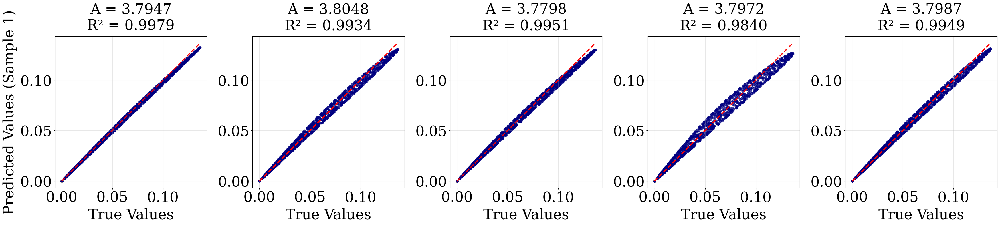


--- Plotting sample 7 (test index = 113) ---
X_test_i: (1024,)
true_params_i: [4.898196   0.64160687 0.4408299 ]


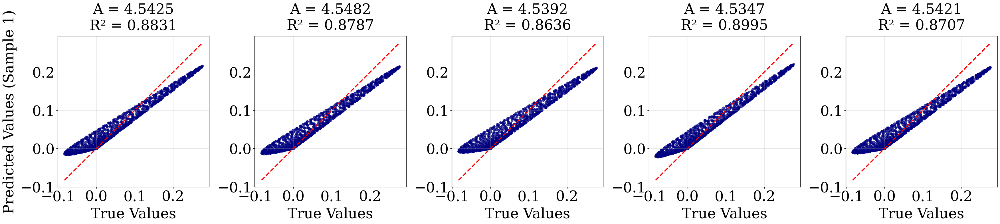


--- Plotting sample 8 (test index = 61) ---
X_test_i: (1024,)
true_params_i: [5.299751   0.4455398  0.41682404]


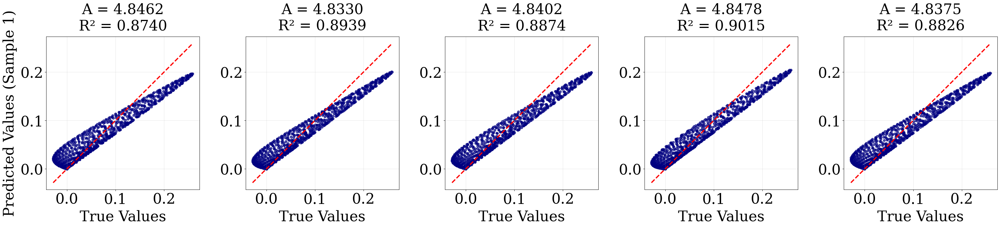


--- Plotting sample 9 (test index = 105) ---
X_test_i: (1024,)
true_params_i: [2.2668273  0.38600418 0.5400535 ]


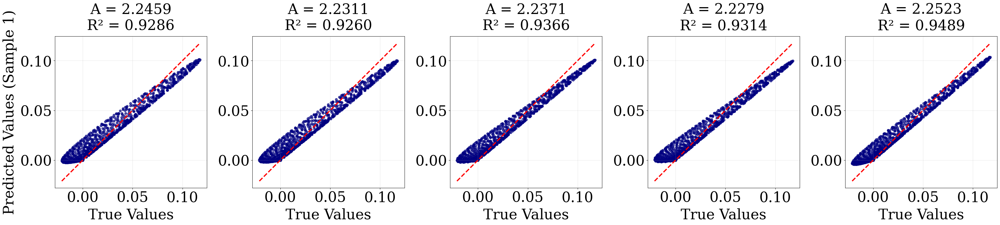


--- Plotting sample 10 (test index = 101) ---
X_test_i: (1024,)
true_params_i: [3.991577   0.3897788  0.59432447]


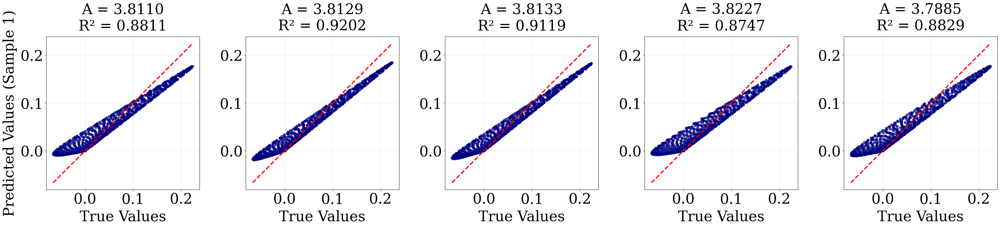


--- Parameter distribution for sample 1 (test index = 18) ---


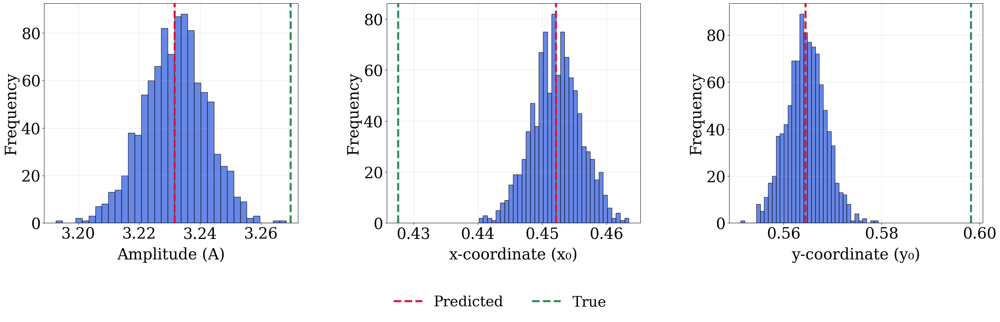


--- Parameter distribution for sample 2 (test index = 110) ---


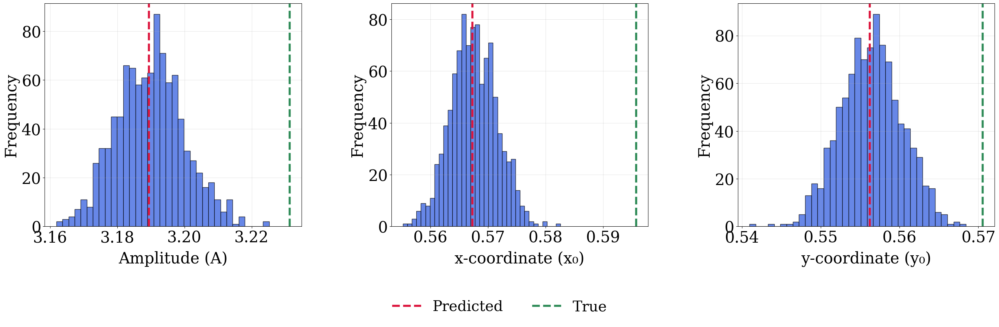


--- Parameter distribution for sample 3 (test index = 151) ---


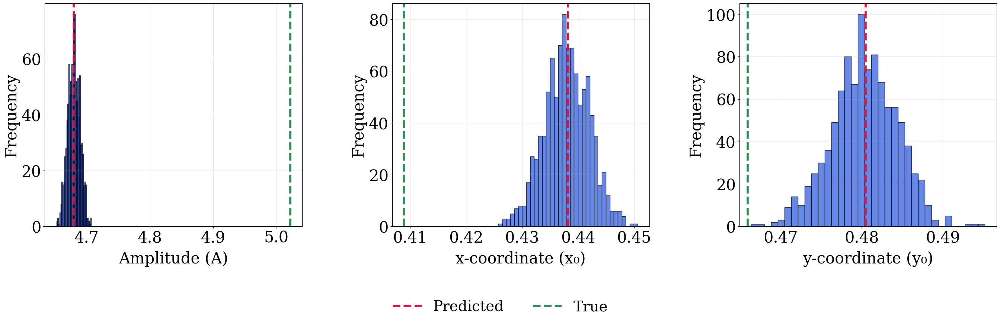


--- Parameter distribution for sample 4 (test index = 74) ---


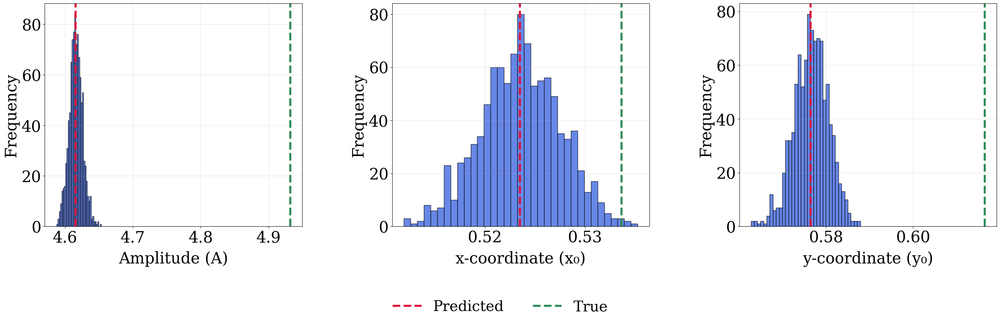


--- Parameter distribution for sample 5 (test index = 7) ---


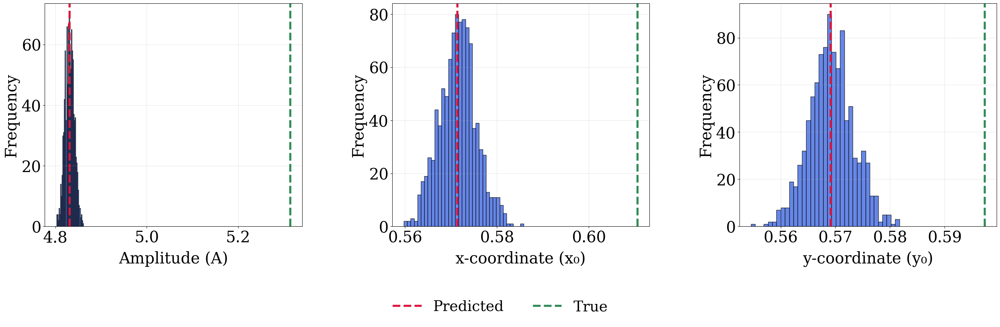


--- Parameter distribution for sample 6 (test index = 0) ---


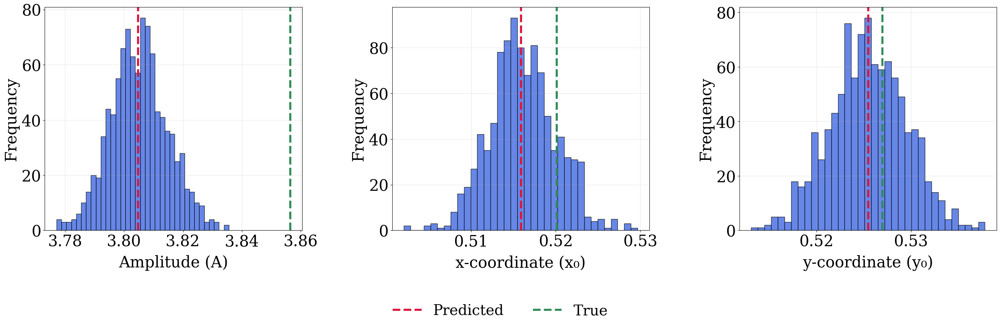


--- Parameter distribution for sample 7 (test index = 113) ---


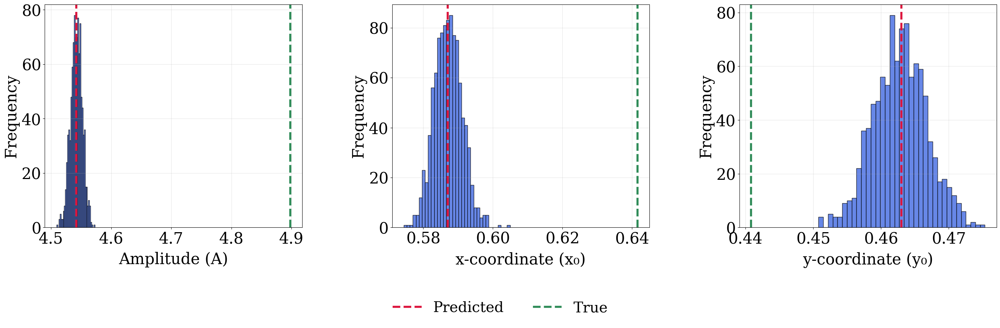


--- Parameter distribution for sample 8 (test index = 61) ---


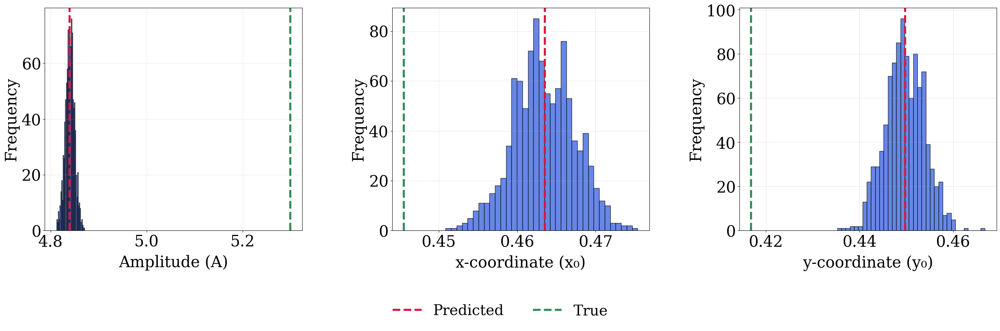


--- Parameter distribution for sample 9 (test index = 105) ---


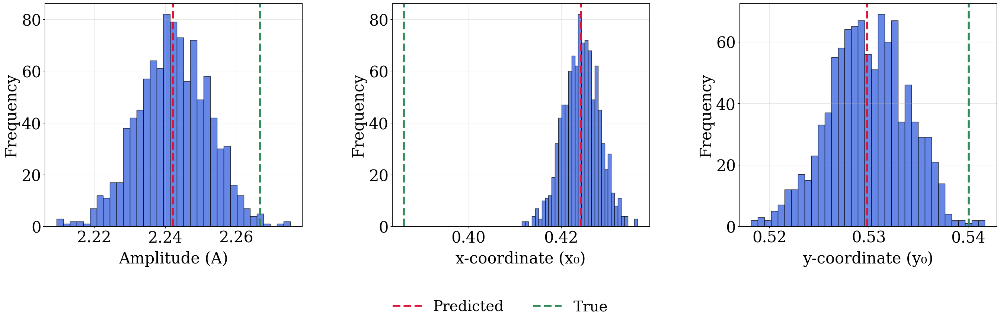


--- Parameter distribution for sample 10 (test index = 101) ---


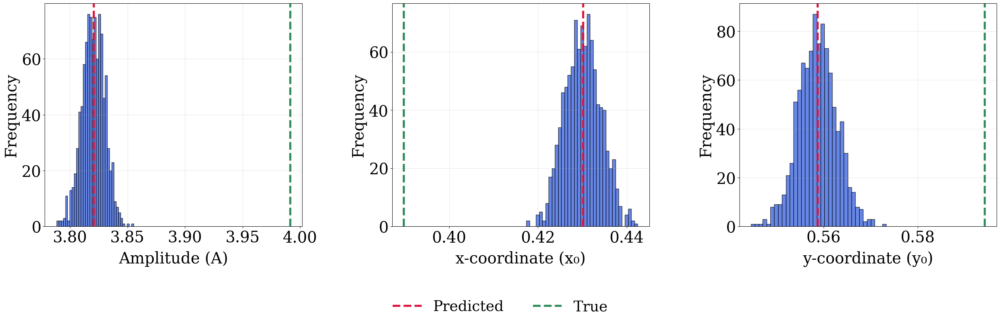


All plots saved successfully.


In [29]:
import os
import numpy as np

# ============================================================
# Create output folder if not exists
# ============================================================
output_folder = "paper_plots_dist_2"
os.makedirs(output_folder, exist_ok=True)
print(f"Saving all images to: {output_folder}")


# ============================================================
# Plot sampled solutions for 10 random test samples
# ============================================================
num_random_samples = 10

# choose random test sample indices
rand_indices = np.random.choice(len(X_test), size=num_random_samples, replace=False)
print("Random sample indices:", rand_indices)

for i, idx in enumerate(rand_indices):

    print(f"\n--- Plotting sample {i+1} (test index = {idx}) ---")

    X_test_i = X_test[idx]
    true_params_i = param_test[idx]

    print("X_test_i:", X_test_i.shape)
    print("true_params_i:", true_params_i)

    # file path inside folder
    save_path_sample = os.path.join(output_folder, f"sampled_solutions_sample_{idx}.png")

    # call plotting function
    plot_sampled_solutions(
        model_inv_fn,
        params_inv,
        X_test_i,
        n_samples=5,
        n_grid=64,
        save_path=save_path_sample
    )


# ============================================================
# Plot parameter distributions for the same 10 samples
# ============================================================
for i, idx in enumerate(rand_indices):

    print(f"\n--- Parameter distribution for sample {i+1} (test index = {idx}) ---")

    X_test_i = X_test[idx]
    true_params_i = param_test[idx]

    # file path inside folder
    save_path_param = os.path.join(output_folder, f"parameter_distribution_sample_{idx}.png")

    plot_parameter_distributions(
        model_inv_fn,
        params_inv,
        X_test_i[None, ...],  # keep batch dim
        true_params_i,
        n_samples=1000,
        save_path=save_path_param
    )

print("\nAll plots saved successfully.")


Saving plots to: paper_plots_dist_2

--- Processing test index = 6 ---
X_test_i shape: (1024,)
true_params_i: [2.4594738  0.48845327 0.5793385 ]


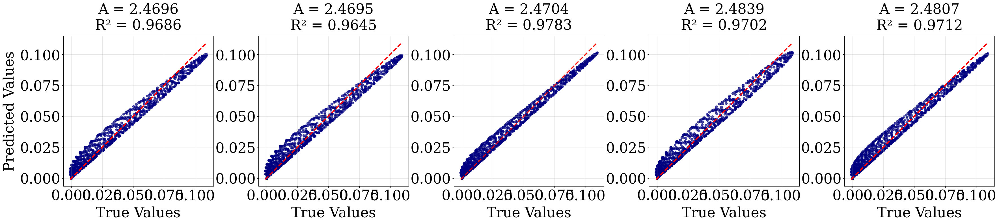

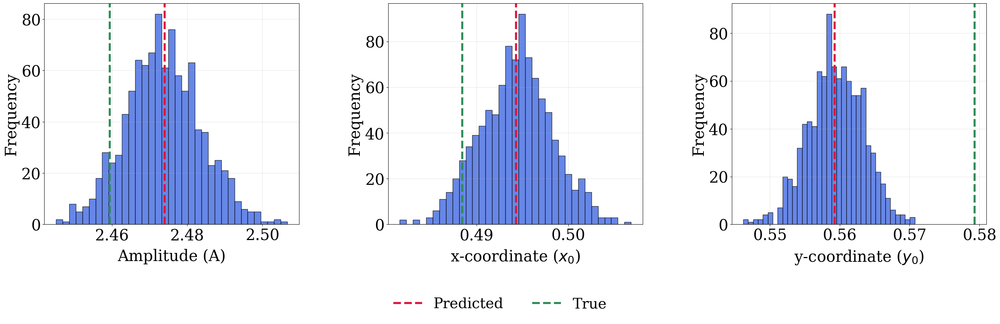


Plots for index 6 saved successfully.


In [34]:
import os
import numpy as np

# ============================================================
# Create output folder if not exists
# ============================================================
output_folder = "paper_plots_dist_2"
os.makedirs(output_folder, exist_ok=True)
print(f"Saving plots to: {output_folder}")

# ============================================================
# Define the specific index to plot
# ============================================================
idx = 6  # Only test index zero
print(f"\n--- Processing test index = {idx} ---")

X_test_i = X_test[idx]
true_params_i = param_test[idx]

print("X_test_i shape:", X_test_i.shape)
print("true_params_i:", true_params_i)

# ============================================================
# Plot sampled solutions for index 0
# ============================================================
save_path_sample = os.path.join(output_folder, f"sampled_solutions_sample_{idx}.png")

plot_sampled_solutions(
    model_inv_fn,
    params_inv,
    X_test_i,
    n_samples=5,
    n_grid=64,
    save_path=save_path_sample
)

# ============================================================
# Plot parameter distribution for index 0
# ============================================================
save_path_param = os.path.join(output_folder, f"parameter_distribution_sample_{idx}.png")

plot_parameter_distributions(
    model_inv_fn,
    params_inv,
    X_test_i[None, ...],  # keep batch dim
    true_params_i,
    n_samples=1000,
    save_path=save_path_param
)

print(f"\nPlots for index {idx} saved successfully.")

Saving plots to: paper_plots_dist_2

--- Processing test index = 14 ---
X_test_i shape: (1024,)
true_params_i: [4.702052   0.53409606 0.47036576]


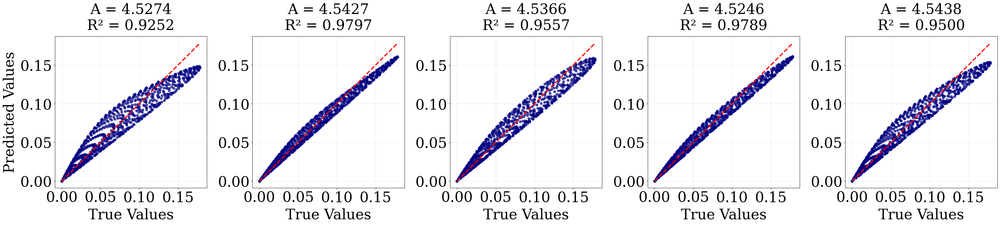

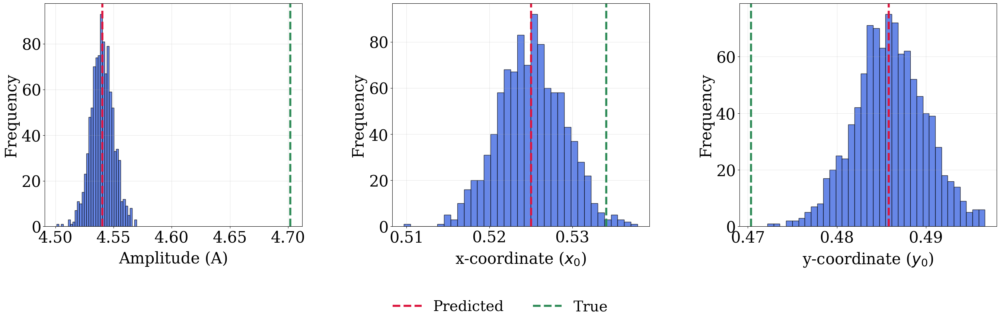


Plots for index 14 saved successfully.


In [42]:
import os
import numpy as np

# ============================================================
# Create output folder if not exists
# ============================================================
output_folder = "paper_plots_dist_2"
os.makedirs(output_folder, exist_ok=True)
print(f"Saving plots to: {output_folder}")

# ============================================================
# Define the specific index to plot
# ============================================================
idx = 14  # Only test index zero #7
print(f"\n--- Processing test index = {idx} ---")

X_test_i = X_test[idx]
true_params_i = param_test[idx]

print("X_test_i shape:", X_test_i.shape)
print("true_params_i:", true_params_i)

# ============================================================
# Plot sampled solutions for index 0
# ============================================================
save_path_sample = os.path.join(output_folder, f"sampled_solutions_sample_{idx}.png")

plot_sampled_solutions(
    model_inv_fn,
    params_inv,
    X_test_i,
    n_samples=5,
    n_grid=64,
    save_path=save_path_sample
)

# ============================================================
# Plot parameter distribution for index 0
# ============================================================
save_path_param = os.path.join(output_folder, f"parameter_distribution_sample_{idx}.png")

plot_parameter_distributions(
    model_inv_fn,
    params_inv,
    X_test_i[None, ...],  # keep batch dim
    true_params_i,
    n_samples=1000,
    save_path=save_path_param
)

print(f"\nPlots for index {idx} saved successfully.")